from IPython.core.display import HTML
HTML("<script>MathJax.Hub.Config({displayAlign: 'left'});</script>")

# Image Processing

## Motivation
- May seem unnecessary in the age of deep learning
- But it is still important to understand the basics
- And it is still useful for pre-processing
- When we studied relationships of points in 2D to points in the 3D world, we used the pinhole camera model
    - Assumed we knew the point location in the image
    - In practice, we need to find points automatically
    - This is called **feature detection**
- Critical that it be computationally efficient
    - We need to do it for every frame of video
    - And we need to do it in real time
- Modern feature detectors still rely on image processing
    - Our brief introduction to image processing will help us understand how they work
    - A course is offered next fall that will go into far more detail on image processing

## Reading Reference
- Most of these notes have been developed based on Szeliski's book, 2nd edition
    - Chapter 3, Sections 3.1--3.2
- OpenCV Tutorials on image processing are also good

In [128]:
import cv2 as cv
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

plt.rcParams['text.usetex'] = True

In [129]:
def AddColorbar(axes,colorMap='gray'):
    images = axes.get_images()
    if len(images) > 0:
       vmin, vmax = images[0].get_clim()
    sm = matplotlib.cm.ScalarMappable(matplotlib.colors.Normalize(vmin=vmin,vmax=vmax),cmap=colorMap)
    bb = np.array(axes.get_position().bounds)
    bb[0] += bb[2]*0.95
    bb[2] *= 0.05
    
    figure = axes.get_figure()
    barAxes = figure.add_axes(bb)
    figure.colorbar(sm,barAxes)

In [130]:
def GetTestImage(nPixelsPerSide=25):
    iHalf = int(nPixelsPerSide/2)
    i14   = int(nPixelsPerSide*1/4)
    i34   = int(nPixelsPerSide*3/4)
    image = np.ones((nPixelsPerSide,nPixelsPerSide),np.float32)*0.2
    image[iHalf,:] = 1.0
    image[:,iHalf] = 1.0
    image[iHalf:,i34] = 1.0
    image[i34,iHalf:] = 1.0
    image[i14,i34] = 1.0
    for c in range(iHalf): 
        image[c,c] = 1.0
        image[-1-c,c] = 1.0
    image[iHalf:i34,iHalf:i34] = 1.0
    return(image)

In [131]:
def GetImpulseImage(nPixelsPerSide=25):
    iHalf = int(nPixelsPerSide/2)
    image = np.zeros((nPixelsPerSide,nPixelsPerSide),np.float32)
    image[iHalf,iHalf] = 1.0
    return(image)

In [132]:
def GetRampsImage(nPixelsPerSide=25):
    # Creates a plane oriented in a different direction in each of the four 
    # quadrants of the image
    ramp  = np.linspace(0,1,nPixelsPerSide)
    ramp  = ramp.reshape(-1,1) # Convert 1D array into column matrix
    idx = np.arange(0,nPixelsPerSide,dtype='int')
    idx = idx.reshape(-1,1) 
    kr  = np.matmul(idx,np.ones((1,nPixelsPerSide))).astype('int') # Indices of rows
    kc  = np.transpose(kr)
    iHalf = int(nPixelsPerSide/2)
    image = np.zeros((nPixelsPerSide,nPixelsPerSide),np.float32)
    
    Q = kr[:iHalf,:iHalf]
    Q -= Q.min()
    Q = Q/Q.max()
    image[:iHalf,:iHalf] = Q # Quadrant 2
    
    Q = kc[iHalf:,:iHalf]
    Q -= Q.min()
    Q = Q/Q.max()
    image[iHalf:,:iHalf] = Q # Q3
    
    Q = kr[iHalf:,iHalf:] + kc[iHalf:,iHalf:]
    Q -= Q.min()
    Q = Q/Q.max()
    image[iHalf:,iHalf:] = Q # Quadrant 4
    
    Q = kr[:iHalf,iHalf:] - kc[:iHalf,iHalf:] 
    Q -= Q.min()
    Q = Q/Q.max()
    image[:iHalf,iHalf:] = Q # Quadrant 1    

    return(image)

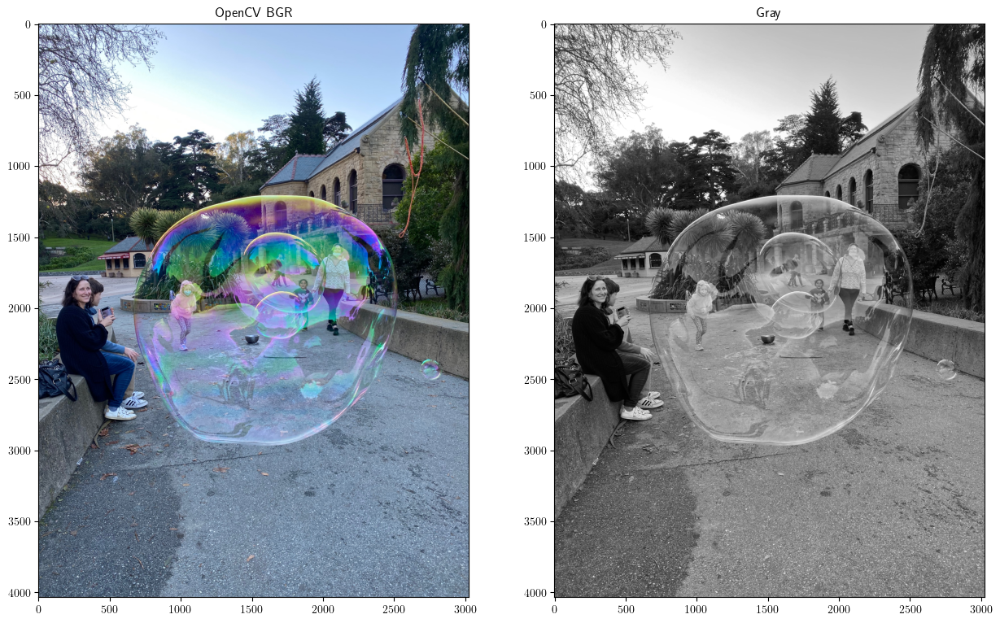

In [133]:
imageBGR  = cv.imread('images/Bubble.jpeg')
imageRGB = cv.cvtColor(imageBGR, cv.COLOR_BGR2RGB)
imageGray = cv.cvtColor(imageBGR, cv.COLOR_BGR2GRAY)

figure = plt.figure()
figure.clf()
figure.set_size_inches(15,10)

axes = figure.add_subplot(121)
axes.imshow(imageRGB)
axes.set_title('OpenCV BGR')

axes = figure.add_subplot(122)
axes.imshow(imageGray,cmap='gray')
axes.set_title('Gray')

plt.show()

## Pixel Operations

### Notational Conventions

* Following notation of the book
* Represent an image as $P$
* $p_{ij}$ is the $i\text{th}$ of $I$ rows and $j\text{th}$ of $J$ columns
    * Note that are indices are in order of rows (vertical) then columns (horizontal)
    * This is the opposite of the convention in plotting (x,y) coordinates where x is horizontal and y is vertical
    * This is a common cause of bugs, so keep a close eye on it
* Scalar representing grayscale intensity 
    * Will discuss color representations later
* Per-pixel operations return a new 2D array $X$ of the same size as $P$

## Whitening
* Goal: provide invariance to mean intensity level
* This could be affected by
    * Camera gain
    * Object reflectance
    * Ambient lighting intensity
* Often a confounding effect that we are not interested in

We can easily calculate the average/mean and standard deviation of values
\begin{align}
    \mu &= \frac{\sum_{i=1}^{I} \sum_{j=1}^{J} p_{ij}}{IJ} \\
    \sigma^2 &= \frac{\sum_{i=1}^{I} \sum_{j=1}^{J} (p_{ij-\mu)^2}}{IJ}
    \text{\hspace{100em}}
\end{align}

* The terms mean and standard deviation are used loosely here
* Presumably the image is merely a sample from an underlying distribution
* If so, these would actually just be estimates calculated from this particular sample

Each pixel could be scaled and shifted to create an image with zero mean and unit variance
\begin{equation}
    x_{ij} = \frac{p_{ij}-\mu}{\sigma} \text{\hspace{100em}}
\end{equation}

* Is this a good idea?
* Depends on the application
* Is the information you're trying to extract partly contained in the average intensity or variation of intensities?
* If so, this normalization might eliminate it

## Addition

* Often pixel intensities are represented as unsigned integers
* When doing math on them, we need to be careful about overflow and underflow
* OpenCV and other image processing libraries can handle this for you
    * They simply clamp the result to the range of the data type
* If you are doing it yourself, you need to be careful
* Not a problem if you are using floating point representations

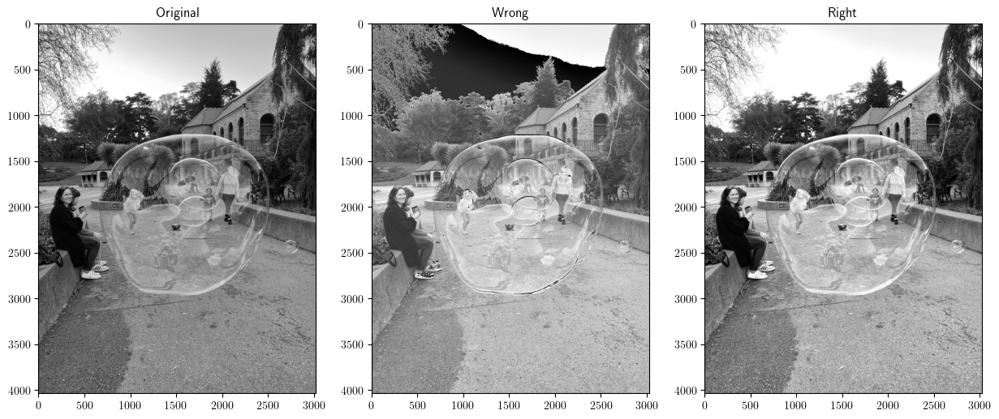

In [134]:
figure = plt.figure()
figure.clf()
figure.set_size_inches(15,10)

# Experiment with various biases, positive and negative
bias = 50 

axes = figure.add_subplot(131)
axes.imshow(imageGray,cmap='gray')
axes.set_title('Original')

axes = figure.add_subplot(132)
axes.imshow((imageGray+bias).astype('uint8'),cmap='gray')
axes.set_title('Wrong')

axes = figure.add_subplot(133)
axes.imshow(cv.add(imageGray,bias),cmap='gray') # Properly handle saturation
axes.set_title('Right')

plt.show()

## Scaling

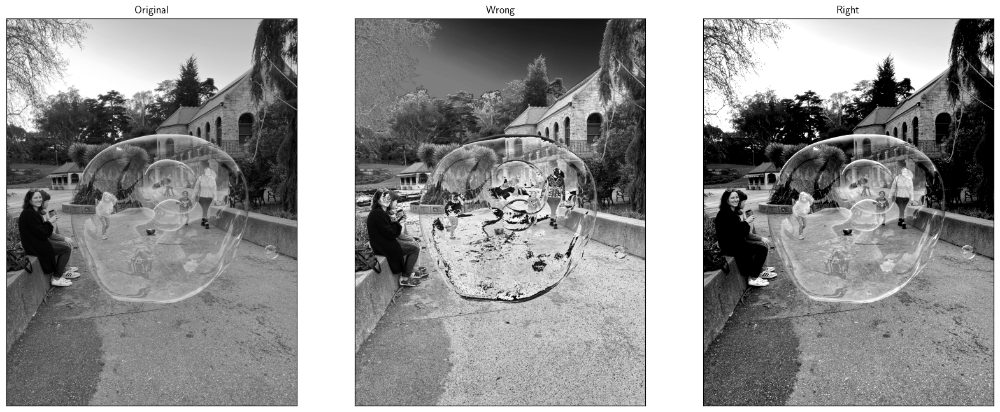

In [135]:
figure = plt.figure()
figure.clf()
figure.set_size_inches(20,10)

# Experiment with various scales, positive and negative
bias  = 0 
scale = 1.5

axes = figure.add_subplot(131)
axes.imshow(imageGray,cmap='gray',vmin=0,vmax=256)
axes.set_title('Original')
axes.set_xticks([])
axes.set_yticks([])

axes = figure.add_subplot(132)
axes.imshow((imageGray*scale).astype('uint8'),cmap='gray',vmin=0,vmax=256)
axes.set_title('Wrong')
axes.set_xticks([])
axes.set_yticks([])

imageScaled = imageGray.copy().astype(np.float32)
imageMean   = imageGray.mean()
imageScaled = (imageScaled-imageMean)*scale + imageMean

axes = figure.add_subplot(133)
#axes.imshow(cv.multiply(imageGray,scale),cmap='gray') # Properly handle saturation
axes.imshow(imageScaled,cmap='gray',vmin=0,vmax=256) # Properly handle saturation
axes.set_title('Right')
axes.set_xticks([])
axes.set_yticks([])

plt.show()

## Image Blending
It's also possible to linearly blend two images $P$ and $Q$

\begin{equation}
    x_{ij} = \alpha p_{ij} + (1-\alpha) q_{ij} \text{\hspace{100em}}
\end{equation}
for some $0 \leq \alpha \leq 1$


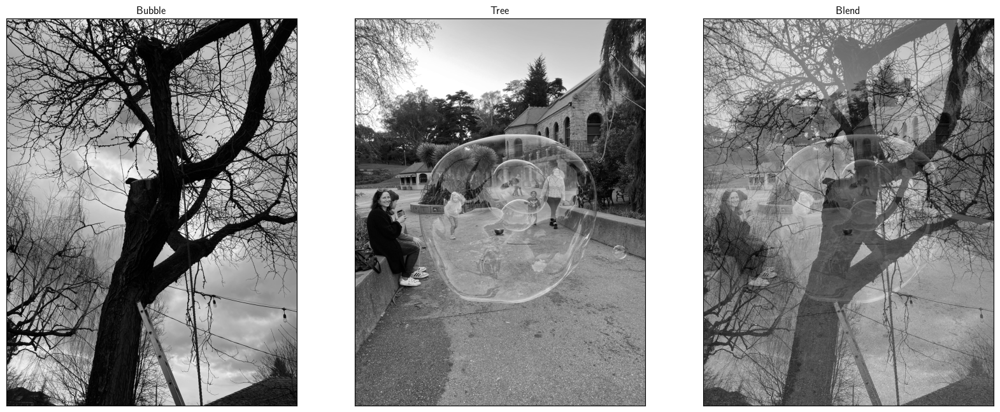

In [136]:
image1 = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
image2 = cv.imread('images/Bubble.jpeg',cv.IMREAD_GRAYSCALE)

# Try different values of alpha
alpha = 0.5 

image3 = cv.addWeighted(image1,alpha,image2,1-alpha,0)

figure = plt.figure()
figure.clf()
figure.set_size_inches(20,15)

axes = figure.add_subplot(131)
axes.imshow(image1,cmap='gray')
axes.set_title('Bubble')
axes.set_xticks([])
axes.set_yticks([])

axes = figure.add_subplot(132)
axes.imshow(image2,cmap='gray')
axes.set_title('Tree')
axes.set_xticks([])
axes.set_yticks([])

axes = figure.add_subplot(133)
axes.imshow(image3,cmap='gray')
axes.set_title('Blend')
axes.set_xticks([])
axes.set_yticks([])

plt.show()

## Histogram Equalization
* Forces the empirical distribution of pixel intensities to be flat

Compute histogram of original intensities
\begin{equation}
    h_k = \sum_{i=1}^{I} \sum_{j=1}^{J} \delta[p_{ij}-k] \text{\hspace{100em}}
\end{equation}

Then determine the cummulative sum and normalize by the number of pixels
\begin{equation}
    c_k = \frac{\sum_{\ell=1}^{k} h_\ell }{IJ} \text{\hspace{100em}}
\end{equation}

Then define a new image as
\begin{equation}
    x_{ij} = K c_{p_{ij}} \text{\hspace{100em}}
\end{equation}

This is similar conceptually to computing the rank of each pixel and then creating an image of the pixel intensity ranks

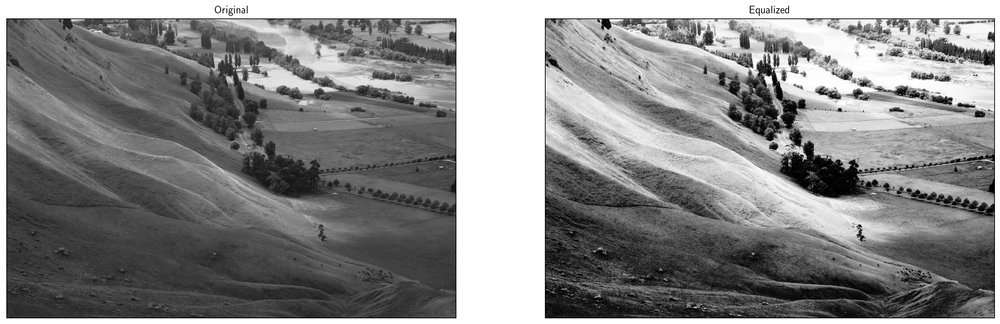

In [137]:
image = cv.imread('images/Unequalized_Hawkes_Bay_NZ.jpg',cv.IMREAD_GRAYSCALE)
equalized = cv.equalizeHist(image)
#equalized2 = cv.equalizeHist(equalized)

figure = plt.figure()
figure.clf()
figure.set_size_inches(20,15)

axes = figure.add_subplot(121)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
axes.set_xticks([])
axes.set_yticks([])

axes = figure.add_subplot(122)
axes.imshow(equalized,cmap='gray')
axes.set_title('Equalized')
axes.set_xticks([])
axes.set_yticks([])

plt.show()

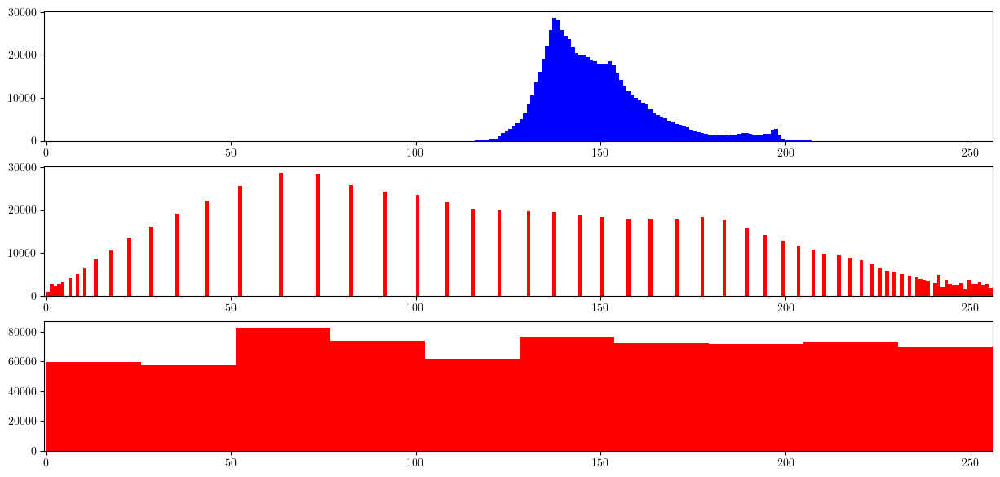

In [138]:
image = cv.imread('images/Unequalized_Hawkes_Bay_NZ.jpg',cv.IMREAD_GRAYSCALE)
equalized = cv.equalizeHist(image)

figure = plt.figure(2)
figure.set_size_inches(15,7)

ri = image.ravel() # Flatten the image into a 1D array
ei = equalized.ravel()

axes = figure.add_subplot(311)
axes.hist(ri,256,[0,256],color='b')
axes.set_xlim([-0.5,256])

axes = figure.add_subplot(312)
axes.hist(ei,256,[0,256],color='r') # What went wrong here?
axes.set_xlim([-0.5,256])

axes = figure.add_subplot(313)
axes.hist(ei,10,[0,256],color='r')
axes.set_xlim([-0.5,256])

plt.show()

## Linear Filtering

* Many of the concepts for signal processing and image processing are the same for linear filters

$g(i,j) = \sum_{k,l} f(i+k,j+l)h(k,l)$

* Instead of impulse response, use the term "kernel" or "mask"
* Is a linear filter

$f_1 \rightarrow g_1$

$f_2 \rightarrow g_2$

Is linear if and only if

$a_1 f_1 + a_2 f_2 \rightarrow a_1 g_1 + a_2 g_2$

for any coefficients $a_1$ and $a_2$ and any images $f_1$, and $f_2$.

* Much of what you learned in Signals and Systems, or Discrete Time Signal Processing for linear filters, applies
* But there are a number of notable differences (later)

### Properties 

#### Associative

$(f \ast g) \ast h = f \ast (g \ast h)$

* Means if we have two linear operations, the order of operations doesn't matter
* If we differeniate and smooth, get the same thing if we first smooth and then differentiate, for example
* Also means we can combine operations into a single filter

#### Commutativity

$f \ast h = h \ast f$


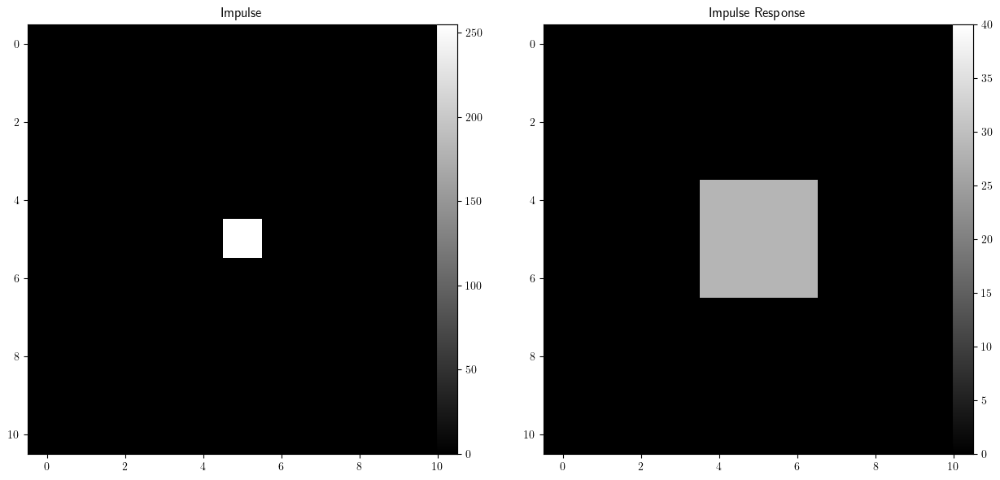

In [139]:
kernelSize = 3 # Try different kernel sizes
nPixelsPerSide = 11

kernel = np.ones((kernelSize,kernelSize),np.float32)/(kernelSize**2) # Impulse Response
iHalf = int((nPixelsPerSide-1)/2)
imageImpulse = np.zeros((nPixelsPerSide,nPixelsPerSide),dtype='float32')
imageImpulse[iHalf,iHalf] = 255

filtered = cv.filter2D(imageImpulse,-1,kernel) # 2D "Convolution" With the Kernel
# Note that this isn't really convolution because it doesn't flip the kernel

# Note that the impulse will be spread out over multiple pixels, so it 
# will be much dimmer in the filtered image

figure = plt.figure()
figure.set_size_inches(15,7)
figure.clf()

axes = figure.add_subplot(121)
axes.imshow(imageImpulse,cmap='gray',vmin=0,vmax=255)
axes.set_title('Impulse')
AddColorbar(axes)

axes = figure.add_subplot(122)
axes.imshow(filtered,cmap='gray',vmin=0,vmax=40) # Note that we can only see it with vmax << 255
axes.set_title('Impulse Response')
AddColorbar(axes)

plt.show()


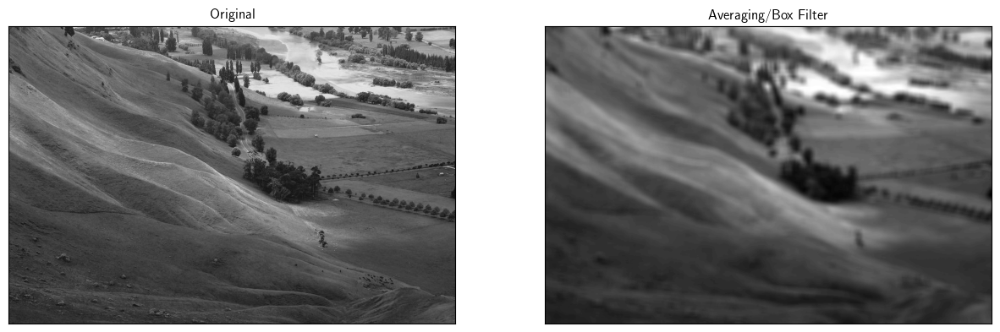

In [140]:
kernelSize = 15 # Try different kernel sizes

# ``Box'' Kernel
kernel = np.ones((kernelSize,kernelSize),np.float32)/(kernelSize**2) # Impulse Response
filtered = cv.filter2D(image,-1,kernel) # 2D Convolution With the Kernel

figure = plt.figure(2)
figure.set_size_inches(15,7)

axes = figure.add_subplot(121)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
axes.set_xticks([])
axes.set_yticks([])

axes = figure.add_subplot(122)
axes.imshow(filtered,cmap='gray')
axes.set_title('Averaging/Box Filter')
axes.set_xticks([])
axes.set_yticks([])

plt.show()

### Separable Filtering
* Many kernels can be expressed as an outer product of two vectors
\begin{equation}
    K = v h^{\mathrm{T}} \text{\hspace{100em}}
\end{equation}
* If you think of $K$ as a matrix, it has rank 1 in this case
* Computationally advantageous, because can apply horizontal and vertical filters separately
    * $K^2$ vs $2K$ computation
* Can determine if a filter is separable with a singular value decomposition 
* Importantly, this means much of our knowledge of FIR filters for signal processing applies

### Compared to Linear Filtering of Signals
* The frequency domain is far less important - both for signals and interpreting filters
    * Interesting because in signal processing much of the analysis and design is in the frequency domain
    * In image processing, it's mostly in the spatial domain (similar to the time domain)
* Kernels tend to be small
    * Kernels tend to be small (3 $\times$ 3, 5 $\times$ 5, etc.)
    * Consequence is frequency response is very broad and smooth
        * In most applications no one cares
* Border effects (often called edge effects in signal processing) are more prominent
    * May or may not be a large issue depending on the size of the image and kernel size/shape
* Computation more limited
    * Most effects increase with the square of the size due to the 2 dimension s
* Almost always non-causal with even symmetry
    * No phase delay
    * Real-valued frequency response
* Almost always FIR
    * Less computation, easier to enforce even symmetry, easier to handle borders


### Border Effects
* Much more important in image processing
* Many more borders than the two edges of a signal recording
* Generally, can
    * Pad with zeros
        * Darkens image near edges
    * Wrap
    * Clamp
        * Propagates border values inward
    * Mirror
        * Preserves color near borders
        * Breaks trend - can be terrible extrapolation
* But there are other options too
    * Extrapolate (if we can model)
    * If averaging, just average the pixels that are within range
        * Only for averaging filters
        * Less bias at the expense of more variance

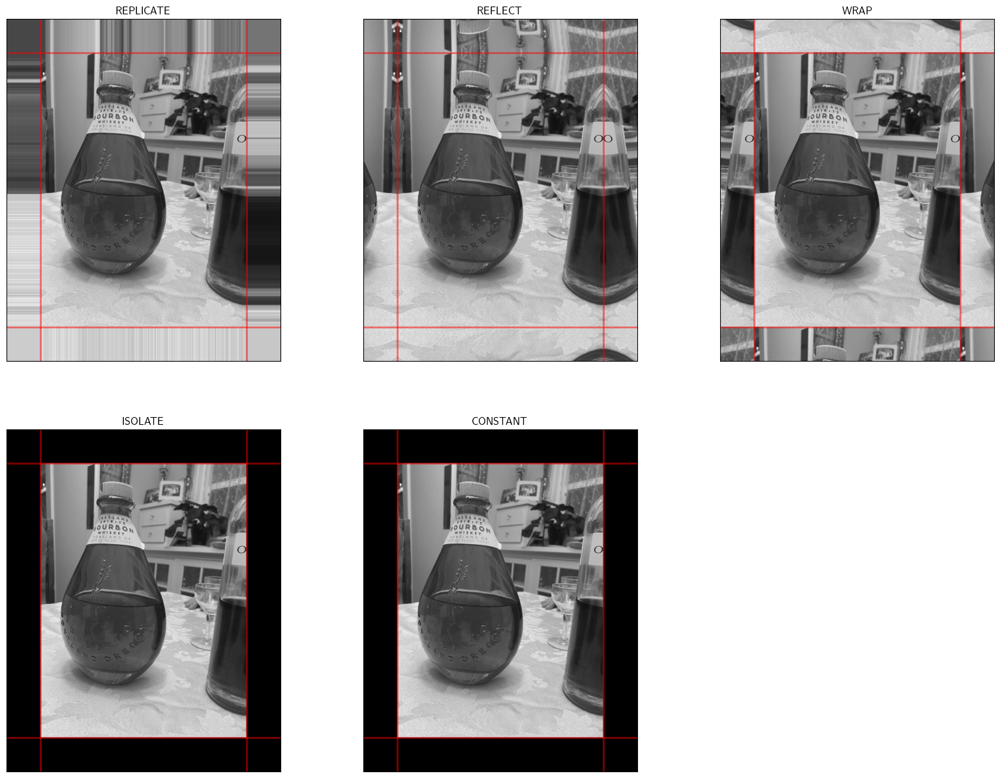

In [141]:
nPixels = 500
image = cv.imread('images/Bourbon.jpeg',cv.IMREAD_GRAYSCALE)

figure = plt.figure()
figure.set_size_inches(20,15)
figure.clf()

borders = list()
borders.append([cv.BORDER_REPLICATE,'REPLICATE'])
borders.append([cv.BORDER_REFLECT,'REFLECT'])
borders.append([cv.BORDER_WRAP,'WRAP'])
borders.append([cv.BORDER_ISOLATED,'ISOLATE'])
borders.append([cv.BORDER_CONSTANT,'CONSTANT'])
#borders.append([cv.BORDER_DEFAULT,'DEFAULT'])
#borders.append([cv.BORDER_TRANSPARENT,'TRANSPARENT'])
#borders.append([cv.BORDER_REFLECT101,'REFLECT101'])

cAxis = 0
for cRow in range(2):
    for cCol in range(3):
        if cAxis==len(borders):
            break
        displayImage = cv.copyMakeBorder(image,nPixels,nPixels,nPixels,nPixels,borders[cAxis][0])
        axes = figure.add_subplot(2,3,cAxis+1)
        axes.imshow(displayImage,cmap='gray')
        axes.axvline(nPixels,color='r',linewidth=2.0,alpha=0.5)
        axes.axvline(displayImage.shape[1]-nPixels,color='r',linewidth=2.0,alpha=0.5)
        axes.axhline(nPixels,color='r',linewidth=2.0,alpha=0.5)
        axes.axhline(displayImage.shape[0]-nPixels,color='r',linewidth=2.0,alpha=0.5)
        axes.set_title(borders[cAxis][1])
        axes.set_xticks([])
        axes.set_yticks([])
        cAxis += 1 
plt.show()

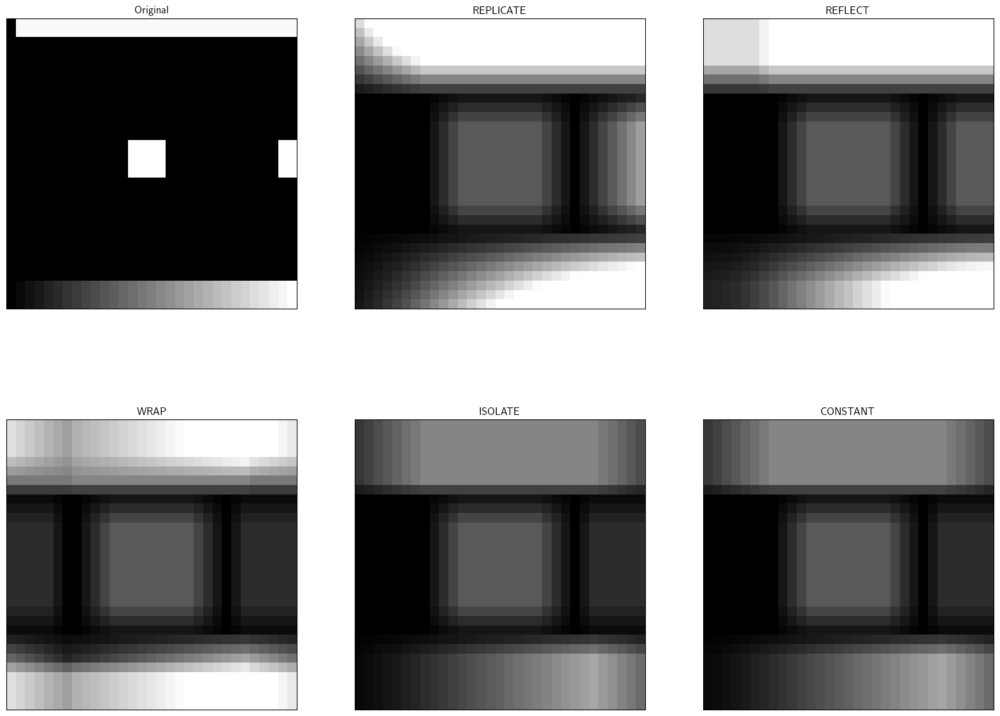

In [142]:
kernelSize = 12 # Try different kernel sizes
nPixelsPerSide = 31

#kernel = np.ones((kernelSize,kernelSize),np.float32)# Impulse Response
#kernel = np.ones((kernelSize,kernelSize),np.float32) # Impulse Response
kernel = np.ones((kernelSize,kernelSize),np.float32)/(kernelSize**2) # Impulse Response

iHalf = int(nPixelsPerSide/2)
imageBorders = np.zeros((nPixelsPerSide,nPixelsPerSide),np.float32)
imageBorders[ 0:2,:] = 250.0 # First row
imageBorders[-1,:] = np.linspace(0,255,nPixelsPerSide).astype('uint8') # Last row
imageBorders[-2,:] = np.linspace(0,255,nPixelsPerSide).astype('uint8') # Last row
imageBorders[-3,:] = np.linspace(0,255,nPixelsPerSide).astype('uint8') # Last row
imageBorders[:, 0] =   0.0
imageBorders[iHalf-2:iHalf+2,-2:] =  255.0
imageBorders[iHalf-2:iHalf+2,iHalf-2:iHalf+2] = 255.0

figure = plt.figure()
figure.set_size_inches(20,15)
figure.clf()

cAxis = 0
axes = figure.add_subplot(2,3,1)
axes.imshow(imageBorders,cmap='gray')
axes.set_title('Original')
axes.set_xticks([])
axes.set_yticks([])
for cRow in range(3):
    for cCol in range(3):
        if cAxis==len(borders):
            break
        if kernelSize<12 and borders[cAxis][0]==cv.BORDER_WRAP: # Doesn't work with this border type if kernelSize<12
           continue            
        displayImage = cv.filter2D(imageBorders,-1,kernel,borderType=borders[cAxis][0]) # 2D Convolution With the Kernel
        axes = figure.add_subplot(2,3,cAxis+2)
        axes.imshow(displayImage,cmap='gray',vmin=0,vmax=80)
        axes.set_title(borders[cAxis][1])
        axes.set_xticks([])
        axes.set_yticks([])
        cAxis += 1 
#plt.show()

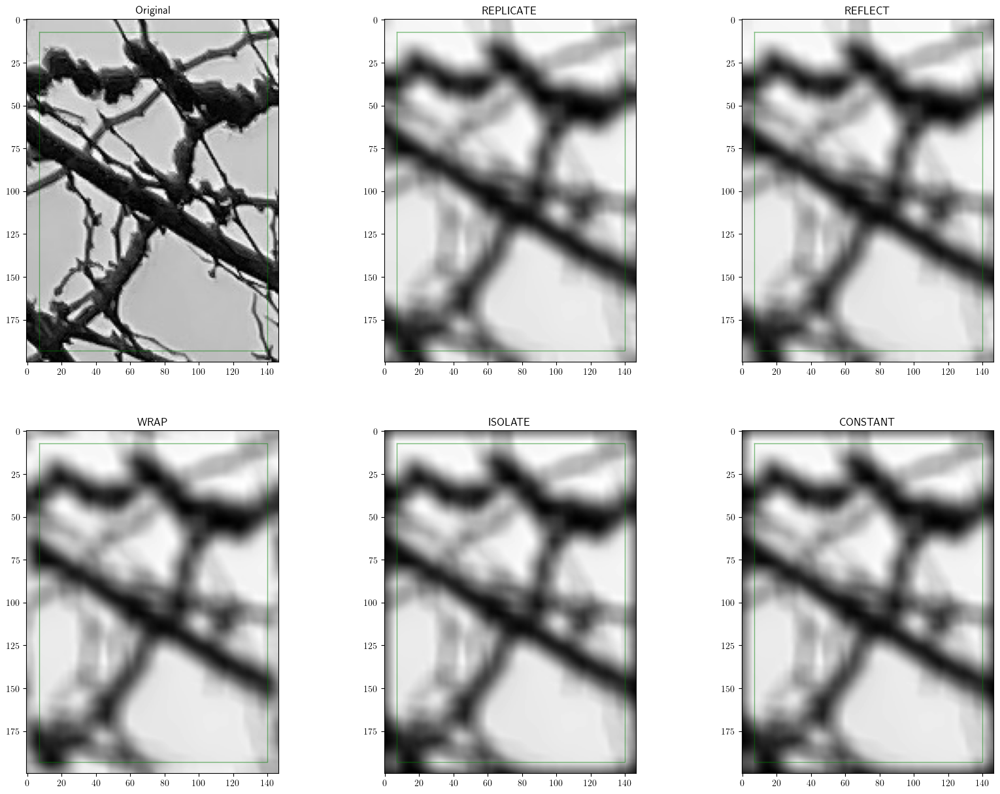

In [143]:
figure = plt.figure()
figure.set_size_inches(20,15)
figure.clf()

kernelWidth = 13

image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
image = image[:200,:147]
bw = int((kernelWidth+1)/2)
re = image.shape[0]-bw
be = image.shape[1]-bw
#cv.rectangle(image,(borderWidth,borderWidth),(image.shape[0]-borderWidth,image.shape[1]-borderWidth),(0,255,0),3)
#cv.rectangle(image,(borderWidth,borderWidth),(200,128),(0,255,0),3)

kernel = np.ones((kernelWidth,kernelWidth),np.float32)/(kernelWidth**2) # Impulse Response

cAxis = 0
axes = figure.add_subplot(2,3,1)
axes.imshow(image,cmap='gray')
axes.plot([bw,bw,be,be,bw],[bw,re,re,bw,bw],color='g',linewidth=1.0,alpha=0.5)
axes.set_title('Original')
for cRow in range(3):
    for cCol in range(3):
        if cAxis==len(borders):
            break
        displayImage = cv.filter2D(image,-1,kernel,borderType=borders[cAxis][0]) # 2D Convolution With the Kernel
        axes = figure.add_subplot(2,3,cAxis+2)
        axes.imshow(displayImage,cmap='gray')
        axes.plot([bw,bw,be,be,bw],[bw,re,re,bw,bw],color='g',linewidth=1.0,alpha=0.5)
        axes.set_title(borders[cAxis][1])
        cAxis += 1 
plt.show()

### Popular Applications
* Smoothing
    * Lowpass filter
* Sharpening 
    * Highpass filter
* Differenting
    * Interesting that the approach is so different in image processing as compared to signal processing
    * Again, focus on small kernels due to border effects and computation rather than accuracy
    * Note that smoothing before differintiating
* Why not integration?
    * Aside from reduced computation (summed area table), not clearly of value
* What about bandpass filtering?



### What is a Gaussian Filter?
* Figure 3.14: 1, 4, 6, 4, 1
    * Really?
    * Convolution of box with itself twice
    * Rationale?
        * Central limit theorem
        * Most non-negative functions convolved many times approach a normal distribution
        * They convolved twice, so is a coarse approximation
* Alternatively

$G(x,y;\sigma) = \frac{1}{2\pi \sigma^2} e^{- \frac{x^2+y^2}{2\sigma^2}}$

* Note the mean is at $x=0$, $y=0$ when expressed this way
* If kernel is finite in extent, how do you clip?

Sum of Gaussian Kernel: 1.0


(-10.0, 10.0)

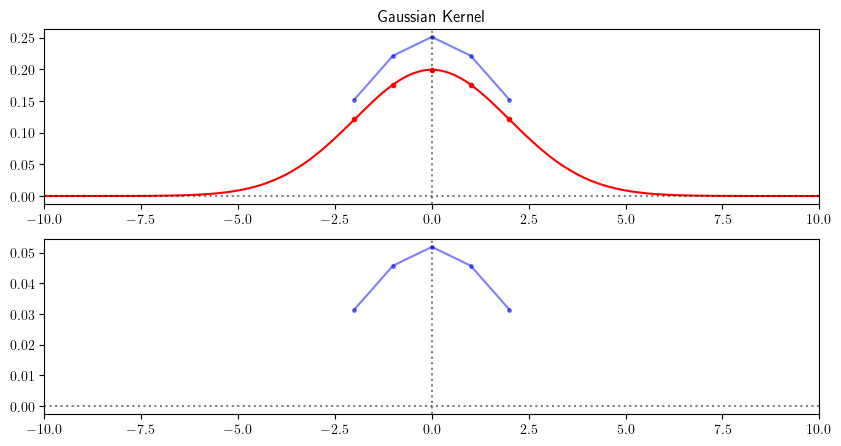

In [144]:
import cv2
import numpy as np

import matplotlib.pyplot as plt

def Normal(t,sigma):
    p = 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (t)**2 / (2 * sigma**2))
    return p

order = 5
sigma = 2.0 # Standard deviation in units of pixels

gk = cv2.getGaussianKernel(order,sigma)
gk = gk.transpose()[0]
k = np.arange(-(order-1)/2,(order-1)/2+1)

print('Sum of Gaussian Kernel: %3.1f' % np.sum(gk))

t = np.linspace(-10.0,10.0,1000)
s = Normal(t,sigma)
sk = Normal(k,sigma)

figure = plt.figure()
figure.clf()
figure.set_size_inches(10,5)

figure.clf()
axes = figure.add_subplot(211)
axes.plot(t,s,color='r')
axes.plot(k,sk,marker='.',color='r',linestyle='None')
axes.plot(k,gk,marker='.',color='b',alpha=0.5,markersize=5)
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian Kernel')

axes = figure.add_subplot(212)
axes.plot(k,gk-sk,marker='.',color='b',alpha=0.5,markersize=5)
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([t[0],t[-1]])

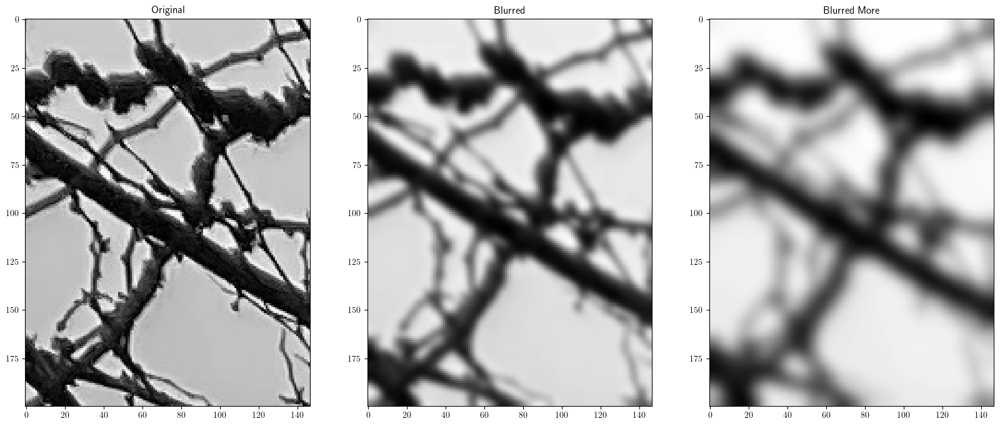

In [145]:
figure = plt.figure()
figure.set_size_inches(20,15)
figure.clf()

image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
image = image[:200,:147]

blurred     = cv.GaussianBlur(image,(51,51),2)
blurredMore = cv.GaussianBlur(image,(51,51),4)

axes = figure.add_subplot(1,3,1)
axes.imshow(image,cmap='gray')
axes.set_title('Original')

axes = figure.add_subplot(1,3,2)
axes.imshow(blurred,cmap='gray')
axes.set_title('Blurred')

axes = figure.add_subplot(1,3,3)
axes.imshow(blurredMore,cmap='gray')
axes.set_title('Blurred More')

plt.show()

## Derivatives

### Background and Review
Recall from when you first started studing calculus, there are several possible definitions of a derivative:

\begin{align*}
    \frac{\mathrm{d} x(t)}{\mathrm{d} t} &= \lim_{\delta \rightarrow 0} \frac{x(t+\delta) - x(t)}{\delta} \\
    \frac{\mathrm{d} x(t)}{\mathrm{d} t} &= \lim_{\delta \rightarrow 0} \frac{x(t) - x(t-\delta)}{\delta} \\
    \frac{\mathrm{d} x(t)}{\mathrm{d} t} &= \lim_{\delta \rightarrow 0} \frac{x(t+\delta) - x(t-\delta)}{2\delta}
    \text{\hspace{100em}}
\end{align*}

When working with a discrete-time signal, we can approximate the continuous-time derivatives with finite differences

\begin{align*}
    \dot{x}[n] &\approx \frac{x((n+1)T_s) - x(nT_s)}{T_s}      && \propto x[n+1] - x[n] \\
    \dot{x}[n] &\approx \frac{x(nT_s) - x((n-1)T_s)}{T_s}      && \propto x[n] - x[n-1] \\
    \dot{x}[n] &\approx \frac{x((n+1)T_s) - x((n-1)T_s)}{2T_s} && \propto x[n+1] - x[n-1]
    \text{\hspace{100em}}
\end{align*}

Keep in mind
* Derivatives don't technically exist for discrete-time signals
* These are pretty crude approximations
    * You can get better approximations by using more points with a proper filter design (e.g., EE~522 DTSP)

### Image Derivatives

* I'm using the term derivative here loosely for now
    * Images are indexed by two discrete-valued indices (row and column) for the pixel centers
    * We can't take a derivative in the traditional sense
    * But differences can approximate derivatives in the same way that finite differences approximate derivatives
* Unlike smoothing, derivatives in an image are directional (along some direction)
* Recall that derivatives are like highpass filters
    * In continuous time, the frequency response magnitude is proportional to the frequency $H(j\omega) = j \omega$
* Low frequencies are attenuated
* High frequencies are amplified
* DC is blocked completely
    * The derivative of a constant is zero
* What happens when we apply a highpass filter to an image?


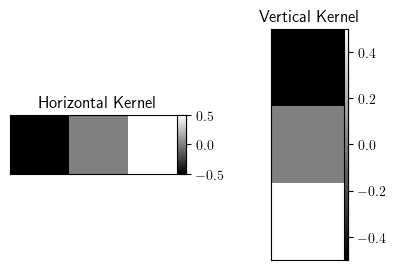

In [146]:
# kernelx is sensitive to changes along the vertical (row) axis
kernelh = np.array([[-1.0,0.0,1.0]])/2.0

# kernely is sensitive to changes along the horizontal (col) axis
kernelv = np.transpose(kernelh)

figure = plt.figure(1)
figure.set_size_inches(5,3)

axes = figure.add_subplot(121)
axes.imshow(kernelh,cmap='gray')
axes.set_title('Horizontal Kernel')
axes.set_xticks([])
axes.set_yticks([])
AddColorbar(axes)

axes = figure.add_subplot(122)
axes.imshow(kernelv,cmap='gray')
axes.set_title('Vertical Kernel')
axes.set_xticks([])
axes.set_yticks([])
AddColorbar(axes)

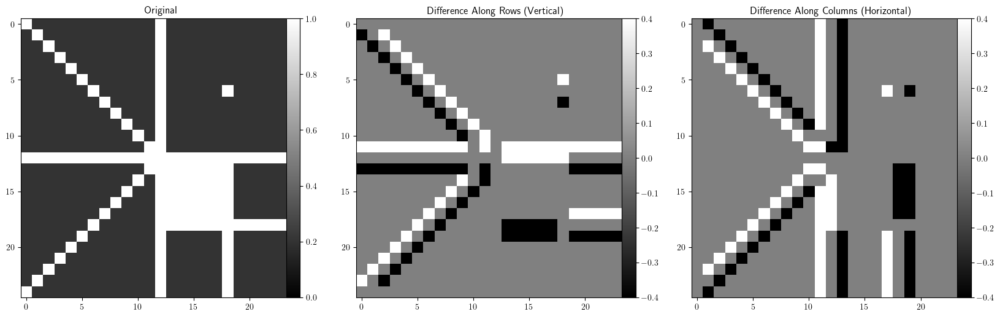

In [147]:
nPixelsPerSide = 25 # For the synthetic image

image = GetTestImage()

filteredh = cv.filter2D(image,cv.CV_32F,kernelh) # 2D "Convolution" With the Horizontal Kernel
filteredv = cv.filter2D(image,cv.CV_32F,kernelv) # 2D "Convolution" With the Vertical Kernel

figure = plt.figure()
figure.set_size_inches(20,15)

axes = figure.add_subplot(131)
axes.imshow(image,cmap='gray',vmin=0,vmax=1.0)
axes.set_title('Original')
AddColorbar(axes)

axes = figure.add_subplot(132)
axes.imshow(filteredv,cmap='gray',vmin=-0.4,vmax=0.4)
axes.set_title('Difference Along Rows (Vertical)')
AddColorbar(axes)

axes = figure.add_subplot(133)
axes.imshow(filteredh,cmap='gray',vmin=-0.4,vmax=0.4)
axes.set_title('Difference Along Columns (Horizontal)')
AddColorbar(axes)

# What type of border was used?

## Derivatives Are Directional

* We can "point" a derivative in any direction we like
* We merely need to make an appropriate linear combination of the horizontal and vertical derivati


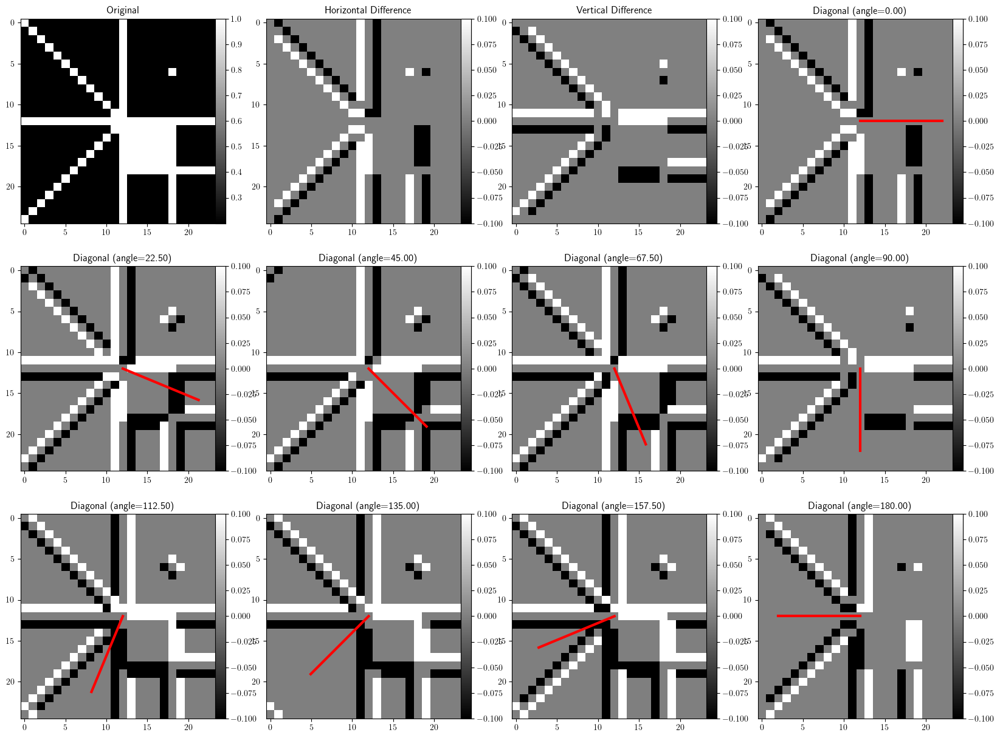

In [148]:
image = GetTestImage()

vmax = 0.1

figure = plt.figure(1)
figure.set_size_inches(20,15)

axes = figure.add_subplot(341)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
AddColorbar(axes)

axes = figure.add_subplot(342)
axes.imshow(filteredh,cmap='gray',vmin=-vmax,vmax=vmax)
axes.set_title('Horizontal Difference')
AddColorbar(axes)

axes = figure.add_subplot(343)
axes.imshow(filteredv,cmap='gray',vmin=-vmax,vmax=vmax)
axes.set_title('Vertical Difference')
AddColorbar(axes)

for cAxis,angle in enumerate(np.linspace(0,180,9)):
    axes = figure.add_subplot(3,4,cAxis+4)
    theta = angle*np.pi/180
    diagonal = np.cos(theta)*filteredh + np.sin(theta)*filteredv
    axes.imshow(diagonal,cmap='gray',vmin=-vmax,vmax=vmax,zorder=0)
    cx = (image.shape[1]-1)/2.0
    cy = (image.shape[0]-1)/2.0
    axes.plot([cx,10*np.cos(theta)+cx],[cy,10*np.sin(theta)+cy],color='r',linewidth=3.0)
    axes.set_title('Diagonal  (angle=%4.2f)' % angle)
    AddColorbar(axes)

plt.show()

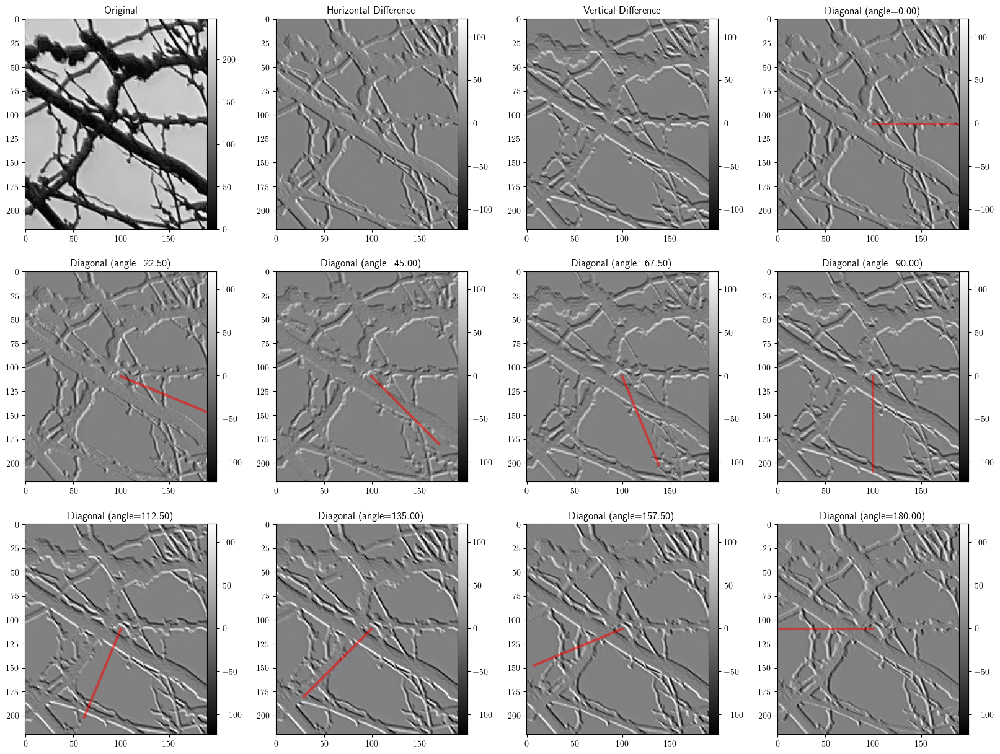

In [149]:
image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
image = image[:220,:200]

filteredh = cv.filter2D(image,cv.CV_32F,kernelh) # 2D Convolution With the Vertical Kernel
filteredv = cv.filter2D(image,cv.CV_32F,kernelv) # 2D Convolution With the Horizontal Kernel

figure = plt.figure(1)
figure.set_size_inches(20,15)

axes = figure.add_subplot(341)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
AddColorbar(axes)

vmin = min(filteredh.min(),filteredv.min())
vmax = max(filteredh.max(),filteredv.max())

axes = figure.add_subplot(342)
axes.imshow(filteredh,cmap='gray',vmin=vmin,vmax=vmax)
axes.set_title('Horizontal Difference')
AddColorbar(axes)

axes = figure.add_subplot(343)
axes.imshow(filteredv,cmap='gray',vmin=vmin,vmax=vmax)
axes.set_title('Vertical Difference')
AddColorbar(axes)

for cAxis,angle in enumerate(np.linspace(0,180,9)):
    axes = figure.add_subplot(3,4,cAxis+4)
    theta = angle*np.pi/180
    diagonal = np.cos(theta)*filteredh + np.sin(theta)*filteredv
    axes.imshow(diagonal,cmap='gray',vmin=vmin,vmax=vmax)
    cx = (image.shape[1]-1)/2.0
    cy = (image.shape[0]-1)/2.0
    r  = min(image.shape)/2
    axes.plot([cx,r*np.cos(theta)+cx],[cy,r*np.sin(theta)+cy],color='r',linewidth=3.0,alpha=0.5)
    axes.set_title('Diagonal  (angle=%4.2f)' % angle)
    AddColorbar(axes)

## Derivative Field

* Generally, we should think of images as 2D continuous surfaces
    * It is merely sampled at discrete points
    * Note the sampling is by averaging over the pixel area (not impulse sampling)
        * This means there is a little bit of smoothing in the sampling process
        * This helps to reduce the impact of aliasing
    * We know from the sampling theorem that we can reconstruct the continuous surface from the samples
    * This means the collection of intensities is just a compact representation of the continuous surface
* The derivatives are local approximations of the gradient of the continuous surface
    * The gradient is a vector
    * The magnitude of the gradient is the rate of change of the intensity
    * The direction of the gradient is the direction of the maximum rate of change
* The gradient has two key properties
    * Direction: Direction of the maximum change
    * Magnitude: The size of the change in slope along the direction
* There are several ways of displaying these properties
    * Field of arrows/lines
    * Separate images of magnitude and phase

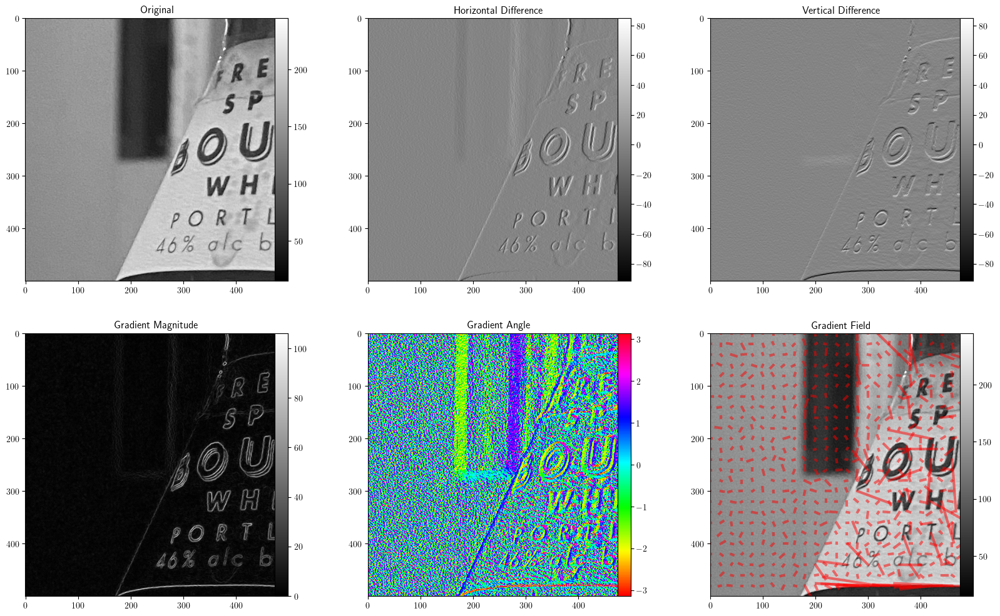

In [150]:
image = cv.imread('images/Bourbon.jpeg',cv.IMREAD_GRAYSCALE)

image = image[700:1200,500:1000]
# Downsample the image by a factor of 8
#image = cv.resize(image,(0,0),fx=0.5,fy=0.5)

filteredh = cv.filter2D(image,cv.CV_32F,kernelh) # 2D Convolution With the Vertical Kernel
filteredv = cv.filter2D(image,cv.CV_32F,kernelv) # 2D Convolution With the Horizontal Kernel

gradientMagnitude = (filteredh**2.0 + filteredv**2.0)**(0.5)
gradientAngle     = np.arctan2(filteredh,filteredv)

figure = plt.figure(1)
figure.set_size_inches(20,12)

axes = figure.add_subplot(231)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
AddColorbar(axes)

vmin = min(filteredh.min(),filteredv.min())
vmax = max(filteredh.max(),filteredv.max())

axes = figure.add_subplot(232)
axes.imshow(filteredh,cmap='gray',vmin=vmin,vmax=vmax)
axes.set_title('Horizontal Difference')
AddColorbar(axes)

axes = figure.add_subplot(233)
axes.imshow(filteredv,cmap='gray',vmin=vmin,vmax=vmax)
axes.set_title('Vertical Difference')
AddColorbar(axes)

axes = figure.add_subplot(234)
axes.imshow(gradientMagnitude,cmap='gray')
axes.set_title('Gradient Magnitude')
AddColorbar(axes)

axes = figure.add_subplot(235)
axes.imshow(gradientAngle,cmap='hsv',vmin=-np.pi,vmax=np.pi)
axes.set_title('Gradient Angle')
AddColorbar(axes,colorMap='hsv')

axes = figure.add_subplot(236)
axes.imshow(image,cmap='gray')
for ir in range(0,image.shape[0],20):
    for ic in range(0,image.shape[1],20):
        cx = ic
        cy = ir
        theta = gradientAngle[ir,ic]
        r = 1.5*gradientMagnitude[ir,ic]
        axes.plot([cx,r*np.cos(theta)+cx],[cy,r*np.sin(theta)+cy],color='r',linewidth=3.0,alpha=0.5)
axes.set_xlim([-0.5,image.shape[1]-0.5])
axes.set_ylim([image.shape[0]-0.5,-0.5])
axes.set_title('Gradient Field')
AddColorbar(axes)

plt.show()

### Prewitt Filters

\begin{align*}
    F_x &= 
        \begin{bmatrix} 
            1,0,-1 \\ 
            1,0,-1 \\
            1,0,-1
        \end{bmatrix} &
    F_y &= 
        \begin{bmatrix} 
            1,1,1 \\ 
            0,0,0 \\ 
            -1,-1,-1
        \end{bmatrix}
    \text{\hspace{100em}}
\end{align*}


* Take an unweighted average across three rows diagonally

### Sobel Filters

\begin{align*}
    F_x &= 
        \begin{bmatrix} 
            1,0,-1 \\ 
            2,0,-2 \\
            1,0,-1
        \end{bmatrix}
    &
    F_y &= 
        \begin{bmatrix} 
            1,2,1 \\ 
            0,0,0 \\ 
            -1,-2,-1
        \end{bmatrix}
    \text{\hspace{100em}}
\end{align*}



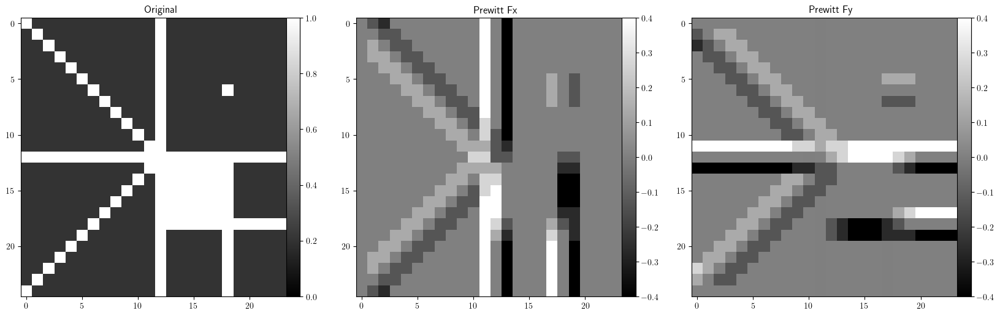

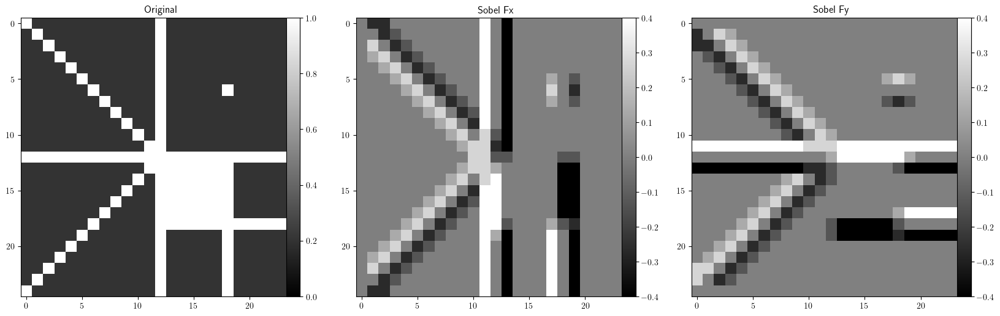

In [151]:
image = GetTestImage()

for c in range(2):
    # kernelx is sensitive to changes along the horizontal (col) axis
    if c==0:
        kernelx = np.array([[-1.0,0.0,1.0],[-1.0,0.0,1.0],[-1.0,0.0,1.0]])/6.0 
        kernelType = 'Prewitt'
    elif c==1:
        kernelx = np.array([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]])/6.0 
        kernelType = 'Sobel'
    kernely = np.transpose(kernelx)
    
    filteredx = cv.filter2D(image,cv.CV_32F,kernelx) # 2D "Convolution" With the Horizontal Kernel
    filteredy = cv.filter2D(image,cv.CV_32F,kernely) # 2D "Convolution" With the Vertical Kernel

    figure = plt.figure()
    figure.set_size_inches(20,15)

    axes = figure.add_subplot(131)
    axes.imshow(image,cmap='gray',vmin=0,vmax=1.0)
    axes.set_title('Original')
    AddColorbar(axes)

    axes = figure.add_subplot(132)
    axes.imshow(filteredx,cmap='gray',vmin=-0.4,vmax=0.4)
    axes.set_title(kernelType + ' Fx')
    AddColorbar(axes)

    axes = figure.add_subplot(133)
    axes.imshow(filteredy,cmap='gray',vmin=-0.4,vmax=0.4)
    axes.set_title(kernelType + ' Fy')
    AddColorbar(axes)

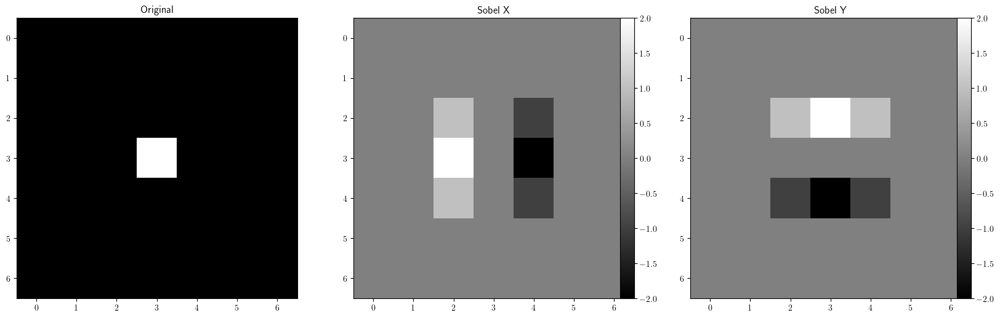

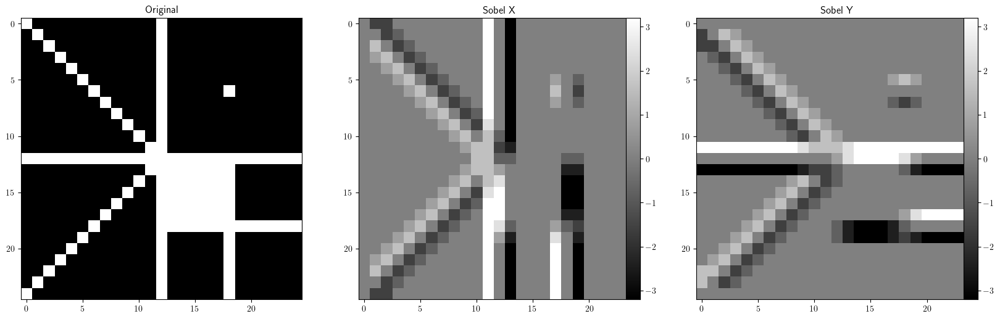

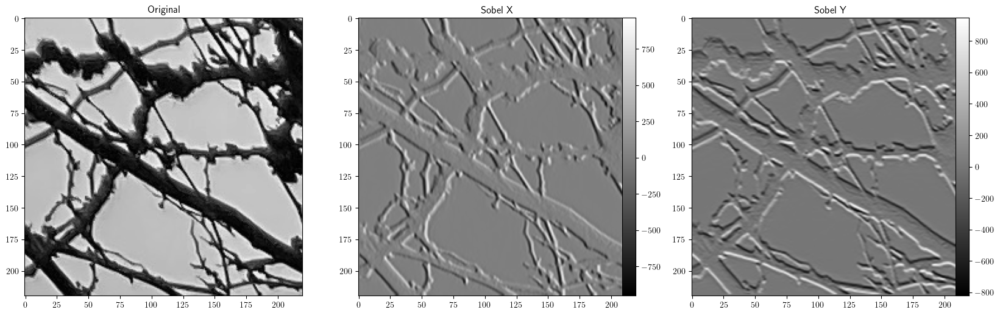

In [152]:
kernelSize =  3 # Try different kernel sizes (must be odd)

for cImage in range(3):
    if cImage==0:
        image = GetImpulseImage(nPixelsPerSide=kernelSize+4)
    elif cImage==1:
        image = GetTestImage()
    else:
        image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
        image = image[:220,:220]

    figure = plt.figure()
    figure.set_size_inches(20,10)
    figure.clf()

    sobelx = cv.Sobel(image,cv.CV_32F,1,0,ksize=kernelSize)
    sobely = cv.Sobel(image,cv.CV_32F,0,1,ksize=kernelSize)

    axes = figure.add_subplot(1,3,1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')

    axes = figure.add_subplot(1,3,2)
    axes.imshow(sobelx,cmap='gray')
    axes.set_title('Sobel X')
    AddColorbar(axes)
    
    axes = figure.add_subplot(1,3,3)
    axes.imshow(sobely,cmap='gray')
    axes.set_title('Sobel Y')
    AddColorbar(axes)

    plt.show()

## Gaussian Derivatives

* In most applications, we wish to smooth as well as diferentiate
* This is partly to filter out noise
* We also are normally interested in features that persist across a range of pixels
* One way to accomplish this is to smooth and then differentiate
* However, we could do this in the other order
    * We'll get the same result regardless of the order of operations
    * This is because linear filters are associative
* Another way to accomplish this is to filter with a differentiated Gaussian



## Kernel Frequency Response
* Useful to think a little about the response in the frequency domain as well
    * Are these most like lowpass, highpass, bandpass, or bandstop filters
* It can be interesting to look at the kernel frequency response
* This is in some respects easier than the general case, because the kernels have even symmetry
    * This is equivalent to a non-causal FIR filter with even symmetry
* Recall that the discrete-time Fourier transform (DTFT) of a signal with even symmetry is real
    
\begin{align}
    h[n] &= h[-n] \text{ even symmetry}\\
    H(e^{j\omega}) &= \sum_{n=-\infty}^{\infty} h[n] e^{-j\omega n}\\
        &= h[0] + \sum_{n=-\infty}^{-1} \left(h[n] e^{-j\omega n}\right) + \sum_{n=1}^{\infty} \left(h[n] e^{-j\omega n}\right)\\
        &= h[0] + \sum_{n=1}^{\infty} \left(h[-n] e^{j\omega n}\right) + \sum_{n=1}^{\infty} \left(h[n] e^{-j\omega n}\right)\\
        &= h[0] + \sum_{n=1}^{\infty} \left(h[n] e^{j\omega n}\right) + \sum_{n=1}^{\infty} \left(h[n] e^{-j\omega n}\right)\\
        &= h[0] + \sum_{n=1}^{\infty} h[n] e^{j\omega n} + h[n] e^{-j\omega n}\\
        &= h[0] + \sum_{n=1}^{\infty} h[n] (e^{j\omega n} + e^{-j\omega n})\\
        &= h[0] + 2 \sum_{n=1}^{\infty} h[n] \cos(\omega n)
    \text{\hspace{100em}}
\end{align}


In [153]:
# All of these are based on the true Gaussian, and not the binomial approximation
def Normal(t,sigma):
    #p = 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (t)**2 / (2 * sigma**2))
    p = (np.pi*2*sigma**2)**(-0.5)*np.exp(-t**2.0/(2*sigma**2))
    return p
def NormalD1(t,sigma):
    p = (-2*t/(2*sigma**2))*(np.pi*2*sigma**2)**(-0.5)*np.exp(-t**2.0/(2*sigma**2))
    return p
def NormalD2(t,sigma):
    p0 = (np.pi*2*sigma**2)**(-0.5)*np.exp(-t**2.0/(2*sigma**2))
    p1 = (-2/(2*sigma**2))*p0
    p2 = (-2*t/(2*sigma**2))**2*p0
    p  = p1+p2
    return p

In [154]:
def SymmetricKernelDTFT(kernel):
    kernelSize = len(kernel)
    omega = np.linspace(0,np.pi,1000)
    ns = np.arange(-(kernelSize-1)/2,(kernelSize-1)/2+1)
    H = np.zeros_like(omega)
    
    offset = int((kernelSize-1)/2)
    for n in ns:
        H = H + kernel[int(n)+offset]*np.cos(omega*n)
    return omega,H

In [155]:
def KernelDTFT(kernel):
    kernelSize = len(kernel)
    omega = np.linspace(0,np.pi,1000)
    ns = np.arange(-(kernelSize-1)/2,(kernelSize-1)/2+1)
    H = np.zeros_like(omega)
    
    offset = int((kernelSize-1)/2)
    for n in ns:
        H = H + kernel[int(n)+offset]*np.exp(-1j*omega*n)
    return omega,H

Sum of Gaussian Kernel: 1.0


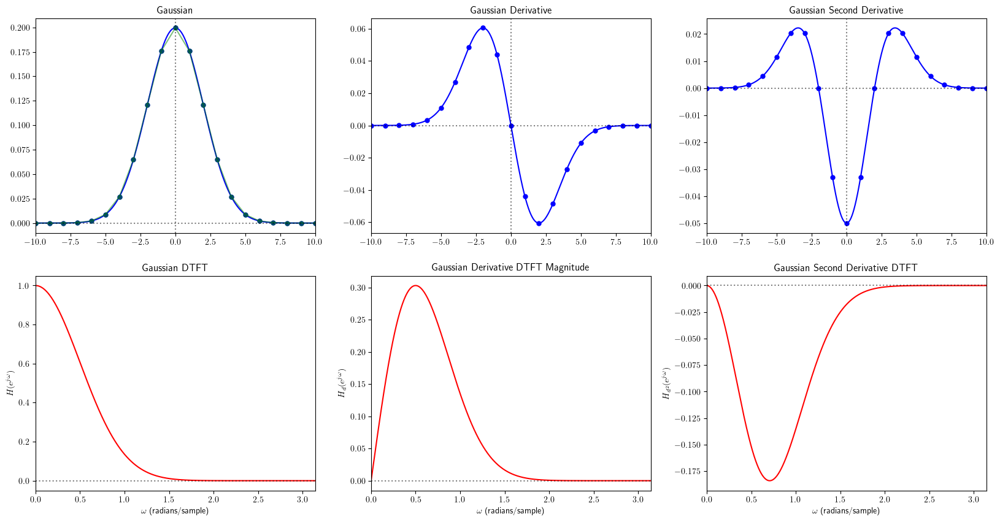

In [156]:
order = 21
sigma = 2.0 # Standard deviation in units of pixels - try different values

gk = cv.getGaussianKernel(order,sigma)
gk = gk.transpose()[0]
k = np.arange(-(order-1)/2,(order-1)/2+1)

print('Sum of Gaussian Kernel: %3.1f' % np.sum(gk))

t = np.linspace(-10.0,10.0,1000)

figure = plt.figure()
figure.clf()
figure.set_size_inches(20,10)

figure.clf()
axes = figure.add_subplot(231)
axes.plot(t,Normal(t,sigma),color='b')
axes.plot(k,Normal(k,sigma),marker='.',color='b',linestyle='None',markersize=10)
axes.plot(k,gk,marker='.',color='g',alpha=0.5,markersize=10)
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian')

axes = figure.add_subplot(232)
axes.plot(t,NormalD1(t,sigma),color='b')
axes.plot(k,NormalD1(k,sigma),marker='.',color='b',linestyle='None',markersize=10)
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian Derivative')

axes = figure.add_subplot(233)
axes.plot(t,NormalD2(t,sigma),color='b')
axes.plot(k,NormalD2(k,sigma),marker='.',color='b',linestyle='None',markersize=10)
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian Second Derivative')

omega,H = SymmetricKernelDTFT(Normal(k,sigma))
axes = figure.add_subplot(234)
axes.plot(omega,H,color='r')
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([omega[0],omega[-1]])
axes.set_title('Gaussian DTFT')
axes.set_ylabel('$H(e^{j\omega})$')
axes.set_xlabel('$\omega$ (radians/sample)')

omega,H = KernelDTFT(NormalD1(k,sigma)) # Note: This one doesn't have even symmetry
axes = figure.add_subplot(235)
axes.plot(omega,np.abs(H),color='r')
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([omega[0],omega[-1]])
axes.set_title('Gaussian Derivative DTFT Magnitude')
axes.set_ylabel('$H_d(e^{j\omega})$')
axes.set_xlabel('$\omega$ (radians/sample)')

omega,H = SymmetricKernelDTFT(NormalD2(k,sigma))
axes = figure.add_subplot(236)
axes.plot(omega,H,color='r')
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.set_xlim([omega[0],omega[-1]])
axes.set_title('Gaussian Second Derivative DTFT')
axes.set_ylabel('$H_{d^2}(e^{j\omega})$')
axes.set_xlabel('$\omega$ (radians/sample)')

plt.show()

In [157]:
def GaussianKernelDH(order,sigma):
    order += (order+1)%2 # Ensure is odd
    k  = np.arange(-(order-1)/2,(order-1)/2+1)
    k  = k.reshape(-1,1)
    kr = np.matmul(k,np.ones((1,order))) # Indices of rows
    kc = np.transpose(kr) # Indices along columns
    p  = np.flip(NormalD1(kc,sigma))*Normal(kr,sigma)
    return p
def GaussianKernelDV(order,sigma):
    order += (order+1)%2 # Ensure is odd
    k  = np.arange(-(order-1)/2,(order-1)/2+1)
    k  = k.reshape(-1,1)
    kr = np.matmul(k,np.ones((1,order))) # Indices of rows
    kc = np.transpose(kr) # Indices along columns
    p  = Normal(kc,sigma)*np.flip(NormalD1(kr,sigma))
    return p


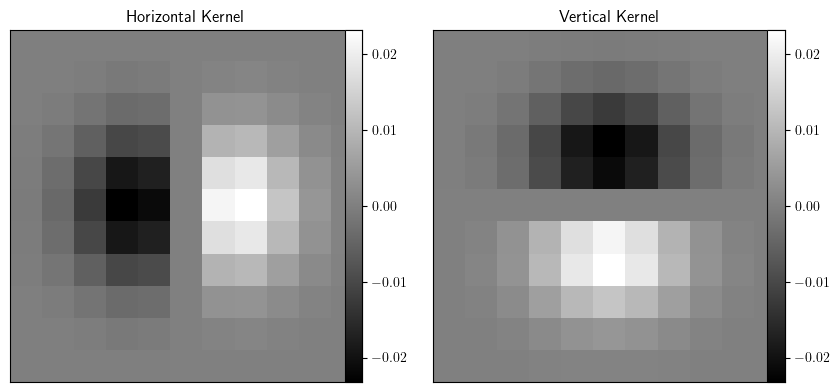

In [158]:
order = 11
sigma = order/7

kernelh = GaussianKernelDH(order,sigma)
kernelv = GaussianKernelDV(order,sigma)

figure = plt.figure(1)
figure.set_size_inches(10,5)

axes = figure.add_subplot(121)
axes.imshow(kernelh,cmap='gray')
axes.set_title('Horizontal Kernel')
axes.set_xticks([])
axes.set_yticks([])
AddColorbar(axes)

axes = figure.add_subplot(122)
axes.imshow(kernelv,cmap='gray')
axes.set_title('Vertical Kernel')
axes.set_xticks([])
axes.set_yticks([])
AddColorbar(axes)

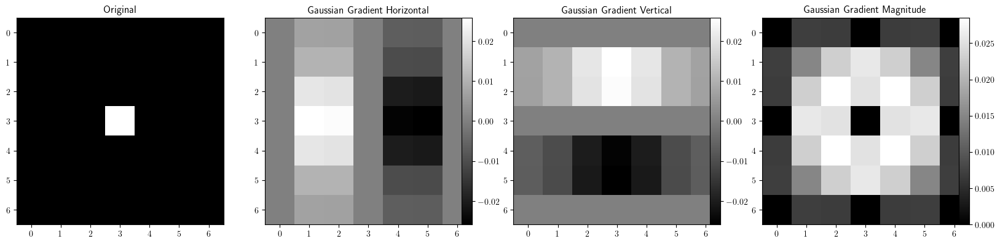

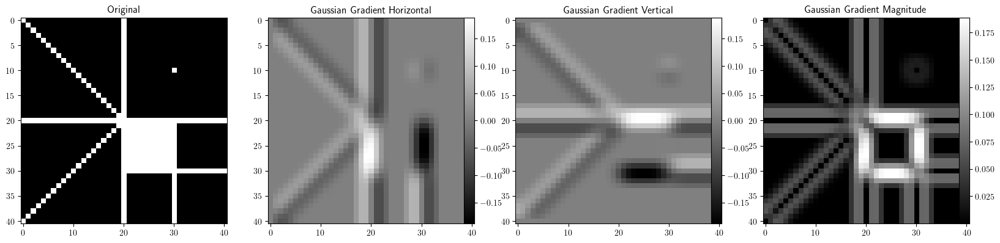

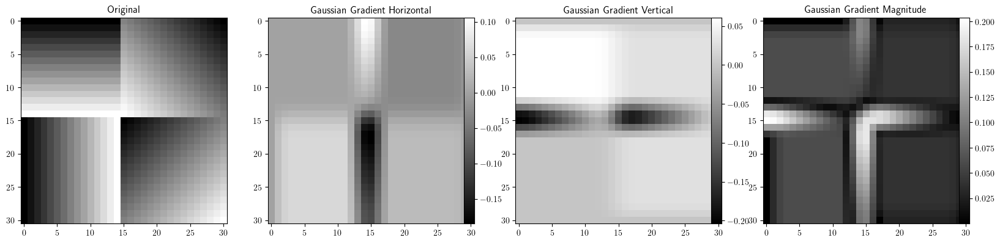

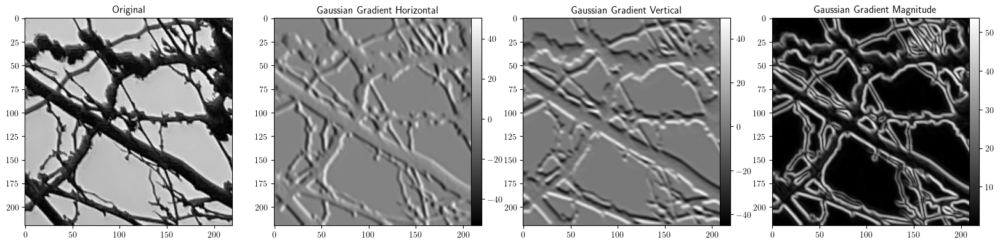

In [159]:
order = 7
sigma = 1.5

kernelh = GaussianKernelDH(order,sigma)
kernelv = GaussianKernelDV(order,sigma)

for cImage in range(4):
    if cImage==0:
        image = GetImpulseImage(nPixelsPerSide=kernelSize+4)
    elif cImage==1:
        image = GetTestImage(nPixelsPerSide=41)
    elif cImage==2:
        image = GetRampsImage(nPixelsPerSide=31)
    else:
        image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
        image = image[:220,:220]

    figure = plt.figure()
    figure.set_size_inches(20,10)
    figure.clf()
    
    filteredh = cv.filter2D(image,cv.CV_32F,kernelh) # 2D "Convolution" With the Horizontal Kernel
    filteredv = cv.filter2D(image,cv.CV_32F,kernelv) # 2D "Convolution" With the Vertical Kernel
    filteredm = (filteredh**2.0 + filteredv**2.0)**0.5
    
    axes = figure.add_subplot(1,4,1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')

    axes = figure.add_subplot(1,4,2)
    axes.imshow(filteredh,cmap='gray')
    axes.set_title('Gaussian Gradient Horizontal')
    AddColorbar(axes)
    
    axes = figure.add_subplot(1,4,3)
    axes.imshow(filteredv,cmap='gray')
    axes.set_title('Gaussian Gradient Vertical')
    AddColorbar(axes)
    
    axes = figure.add_subplot(1,4,4)
    axes.imshow(filteredm,cmap='gray')
    axes.set_title('Gaussian Gradient Magnitude')
    AddColorbar(axes)

    plt.show()

## Gaussian Derivative Differences
* We can also smooth along any direction and subtract
* The image content that isn't changing gets removed
* Sharp features along the direction of the derivative remains
* Will generalize to both directions shortly


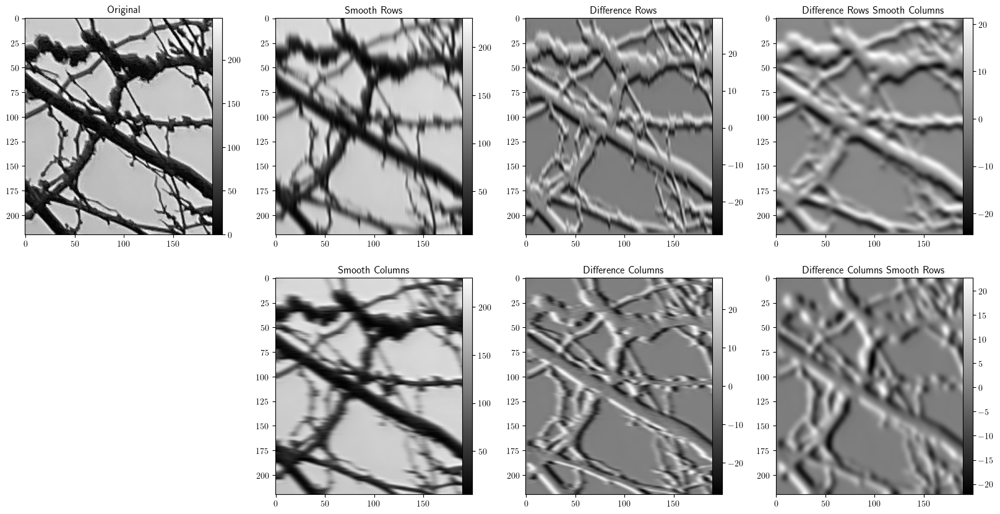

In [160]:
order = 21
sigma = 3.0 # Standard deviation in units of pixels - try different values

image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
image = image[:220,:200]

k  = np.arange(-(order-1)/2,(order-1)/2+1)
ks = Normal  (k,sigma)
kd = NormalD1(k,sigma)

ks = ks.reshape(-1,1)
kd = kd.reshape(-1,1)

iys  = cv.filter2D(image,cv.CV_32F,ks)             # Smooth along rows
iyd  = cv.filter2D(image,cv.CV_32F,kd)             # Differentiate along rows
iydx = cv.filter2D(iyd,cv.CV_32F,np.transpose(ks)) # Smooth along columns

ixs  = cv.filter2D(image,cv.CV_32F,np.transpose(ks)) # Smooth along columns
ixd  = cv.filter2D(image,cv.CV_32F,np.transpose(kd)) # Differentiate along columns
ixdy = cv.filter2D(ixd,cv.CV_32F,ks)                 # Smooth along rows

figure = plt.figure(1)
figure.set_size_inches(20,10)

axes = figure.add_subplot(241)
axes.imshow(image,cmap='gray')
axes.set_title('Original')
AddColorbar(axes)

axes = figure.add_subplot(242)
axes.imshow(iys,cmap='gray')
axes.set_title('Smooth Rows')
AddColorbar(axes)

axes = figure.add_subplot(243)
axes.imshow(iyd,cmap='gray')
axes.set_title('Difference Rows')
AddColorbar(axes)

axes = figure.add_subplot(244)
axes.imshow(iydx,cmap='gray')
axes.set_title('Difference Rows Smooth Columns')
AddColorbar(axes)

axes = figure.add_subplot(246)
axes.imshow(ixs,cmap='gray')
axes.set_title('Smooth Columns')
AddColorbar(axes)

axes = figure.add_subplot(247)
axes.imshow(ixd,cmap='gray')
axes.set_title('Difference Columns')
AddColorbar(axes)

axes = figure.add_subplot(248)
axes.imshow(ixdy,cmap='gray')
axes.set_title('Difference Columns Smooth Rows')
AddColorbar(axes)

plt.show()


## Laplacians
* The first derivative is directional
* The kernel does not have even symmetry
* We can determine the derivative in any direction by a proper linear combination of derivatives along the x and y axes
* A second order derivative gains back the even symmetry
    * As an example, see the second derivative of the Gaussian above
* This means it is no longer directional
* Like a Gaussian kernel, we can form a 2D kernel that calculates the sum of second derivatives in the x and y directions
* If the image was a continuous surface where $x$ and $y$ were the spatial coordinates, the Laplacian would be defined as

\begin{equation*}
    L(x,y) = \frac{\partial^2 I(x,y)}{\partial x^2} + \frac{\partial^2 I(x,y)}{\partial y^2}
    /text{\hspace{100em}}
\end{equation*}

* Simple kernels that approximate this are
    * Note that these kernels are negated, compared to the true Gaussian Laplacian

\begin{align}
    K &= 
        \begin{bmatrix}
            0 &-1 & 0 \\
            -1 & 4 & -1 \\
            0 & -1 & 0
        \end{bmatrix} \\
    K &= 
        \begin{bmatrix}
            -1 & -1 & -1 \\
            -1 & 8 & -1 \\
            -1 & -1 & -1
        \end{bmatrix}
    \text{\hspace{100em}}
\end{align}


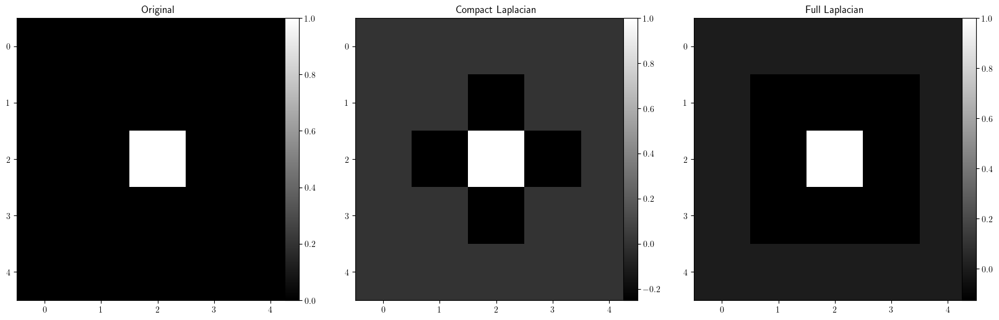

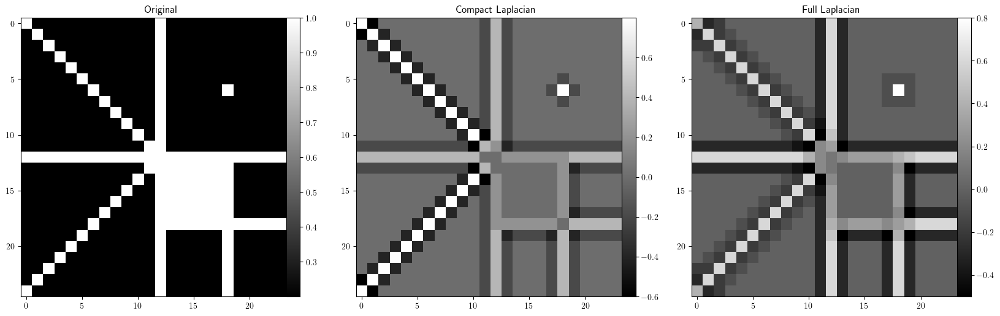

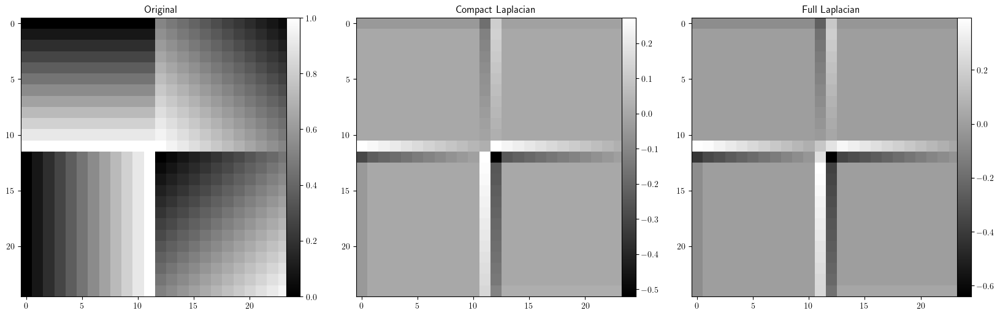

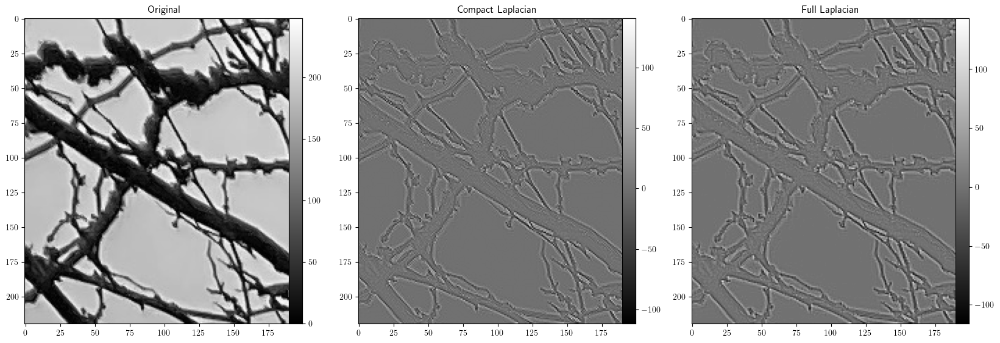

In [161]:
for cImage in range(4):
    if cImage==0:
        image = GetImpulseImage(nPixelsPerSide=5)
    elif cImage==1:
        image = GetTestImage()
    elif cImage==2:
        image = GetRampsImage()        
    else:
        image = cv.imread('images/DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
        image = image[:220,:200]

    figure = plt.figure(1)
    figure.set_size_inches(20,8)

    axes = figure.add_subplot(1,3,1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')
    AddColorbar(axes)

    for c in range(2):
        if c==0:
            kernel = np.array([[0.0,-1.0,0.0],[-1.0,4.0,-1.0],[0.0,-1.0,0.0]])/4.0 
            kernelType = 'Compact Laplacian'
        elif c==1:
            kernel = np.array([[-1.0,-1.0,-1.0],[-1.0,8.0,-1.0],[-1.0,-1.0,-1.0]])/8.0 
            kernelType = 'Full Laplacian'

        filtered = cv.filter2D(image,cv.CV_32F,kernel) # 2D "Convolution" With the Kernel

        axes = figure.add_subplot(1,3,c+2)
        axes.imshow(filtered,cmap='gray')
        axes.set_title(kernelType),
        AddColorbar(axes)
    plt.show()


### Laplacian of Gaussians

* Instead of using simple filters, we can go back to Gaussian filters
* Enables us to smooth and extract the Laplacian at the same time
* Equivalent to using the second derivative of the Gaussian (in both directions) as the kernel

In [162]:
def GaussianKernel(order,sigma):
    order += (order+1)%2 # Ensure is odd
    k  = np.arange(-(order-1)/2,(order-1)/2+1)
    k  = k.reshape(-1,1)
    kr = np.matmul(k,np.ones((1,order))) # Indices of rows
    kc = np.transpose(kr) # Indices along columns
    p  = Normal(kc,sigma)*Normal(kr,sigma)
    return p
def LaplacianOfGaussianKernel(order,sigma):
    order += (order+1)%2 # Ensure is odd
    k  = np.arange(-(order-1)/2,(order-1)/2+1)
    k  = k.reshape(-1,1)
    kr = np.matmul(k,np.ones((1,order))) # Indices of rows
    kc = np.transpose(kr) # Indices along columns
    pr = NormalD2(kr,sigma)*Normal(kc,sigma)
    pc = NormalD2(kc,sigma)*Normal(kr,sigma)
    p  = pr + pc
    return p

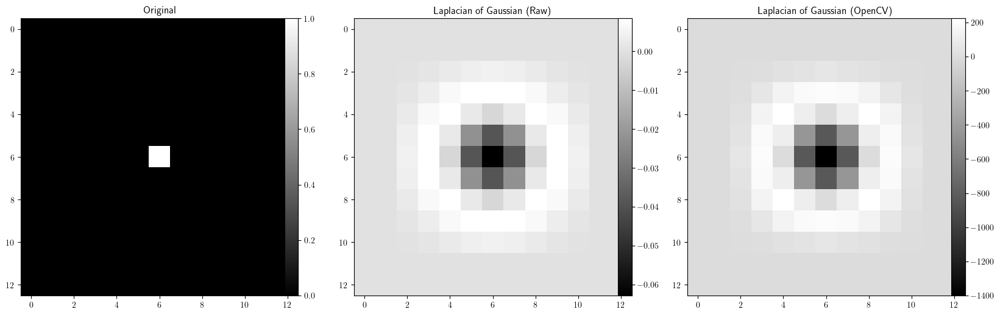

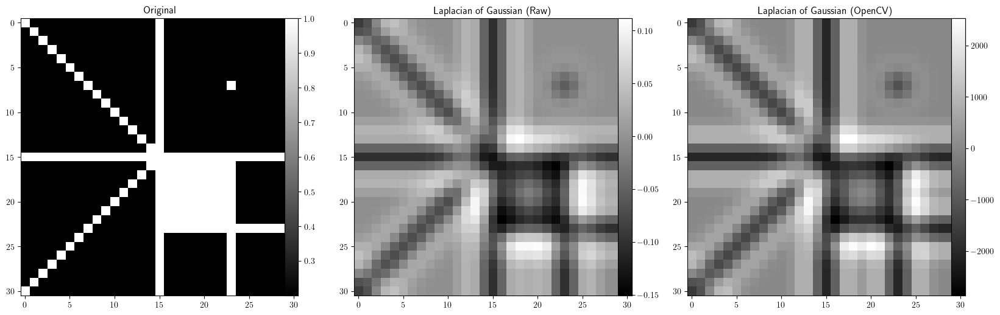

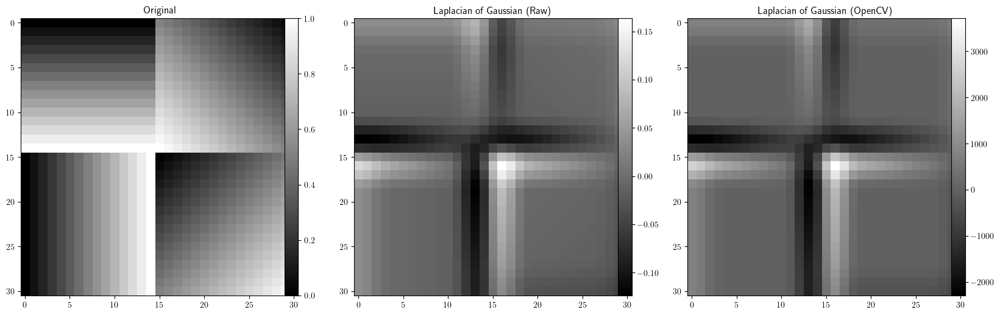

[ WARN:0@4100.217] global loadsave.cpp:248 findDecoder imread_('DarkTree.jpeg'): can't open/read file: check file path/integrity


TypeError: 'NoneType' object is not subscriptable

In [163]:
order = 9 # Try different kernel orders
sigma = order/6 # Standard deviation in units of pixels 

kernel = LaplacianOfGaussianKernel(order,sigma)

# Note that the Laplacian has a negative value at the center of the kernel
# so features with a lot of curature will appear as black, rather than white

for cImage in range(4):
    if cImage==0:
        image = GetImpulseImage(nPixelsPerSide=order+4)
    elif cImage==1:
        image = GetTestImage(nPixelsPerSide=31)
    elif cImage==2:
        image = GetRampsImage(nPixelsPerSide=31)        
    else:
        image = cv.imread('DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
        image = image[:200,:200]

    figure = plt.figure(1)
    figure.set_size_inches(20,10)

    axes = figure.add_subplot(1,3,1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')
    AddColorbar(axes)

    filtered = cv.filter2D(image,cv.CV_32F,kernel) # 2D "Convolution" With the Kernel
    axes = figure.add_subplot(1,3,2)
    axes.imshow(filtered,cmap='gray')
    axes.set_title('Laplacian of Gaussian (Raw)'),
    AddColorbar(axes)
    
    filtered = cv.Laplacian(image,cv.CV_32F,ksize=order)
    axes = figure.add_subplot(1,3,3)
    axes.imshow(filtered,cmap='gray')
    axes.set_title('Laplacian of Gaussian (OpenCV)'),
    AddColorbar(axes)
    
    plt.show()

### Differences of Gaussians

* If we smooth at two different scales with a Gaussian, and then take the difference, we get something similar to using a Laplacian of Gaussians
* If one Gaussian is like a lowpass filter, a difference of Gaussians will be something like a bandpass filter
    * Note that from a signal processing perspective this only works because the filter is symmetric and hence has zero phase


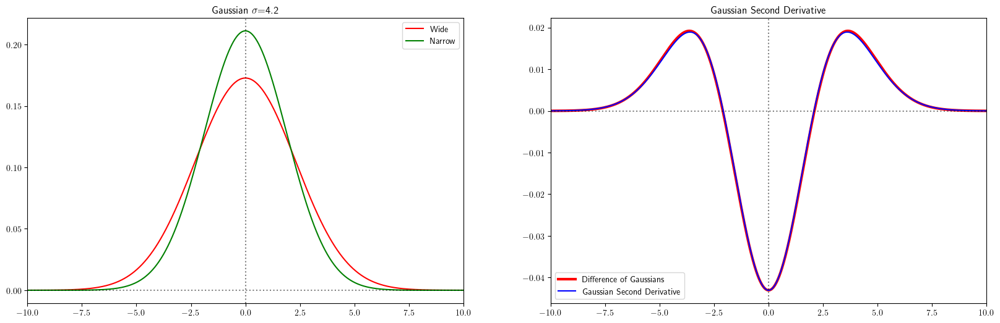

In [ ]:
order = 21
sigma = order/10.0 

t = np.linspace(-10.0,10.0,1000)
k = np.arange(-(order-1)/2,(order-1)/2+1)

figure = plt.figure()
figure.clf()
figure.set_size_inches(20,6)

gw  = Normal(t,sigma*1.10) # This coefficient determined empirically
gn  = Normal(t,sigma*0.90) # This coefficient determined empirically
gd  = gw-gn
g2d = NormalD2(t,sigma)

gd *= g2d.min()/gd.min() # Scale it so it's on thes ame scale as the derivative

figure.clf()
axes = figure.add_subplot(121)
axes.plot(t,gw,color='r',label='Wide')
axes.plot(t,gn,color='g',label='Narrow')
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.legend()
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian $\sigma$=%3.1f' % (sigma*2.0))

#axes = figure.add_subplot(142)
#axes.axhline(0,color='k',linestyle=':',alpha=0.5)
#axes.axvline(0,color='k',linestyle=':',alpha=0.5)
#axes.set_xlim([t[0],t[-1]])
#axes.set_title('Gaussian $\sigma$=%3.1f' % (sigma*0.5))

#axes = figure.add_subplot(132)
#axes.plot(t,gw-gn,color='r')
#axes.axhline(0,color='k',linestyle=':',alpha=0.5)
#axes.axvline(0,color='k',linestyle=':',alpha=0.5)
#axes.set_xlim([t[0],t[-1]])
#axes.set_title('Difference')

axes = figure.add_subplot(122)
axes.plot(t,g2d,color='r',linewidth=3.0,label='Difference of Gaussians')
axes.plot(t,gd ,color='b',linewidth=1.5,label='Gaussian Second Derivative')
axes.axhline(0,color='k',linestyle=':',alpha=0.5)
axes.axvline(0,color='k',linestyle=':',alpha=0.5)
axes.legend()
axes.set_xlim([t[0],t[-1]])
axes.set_title('Gaussian Second Derivative')

plt.show()

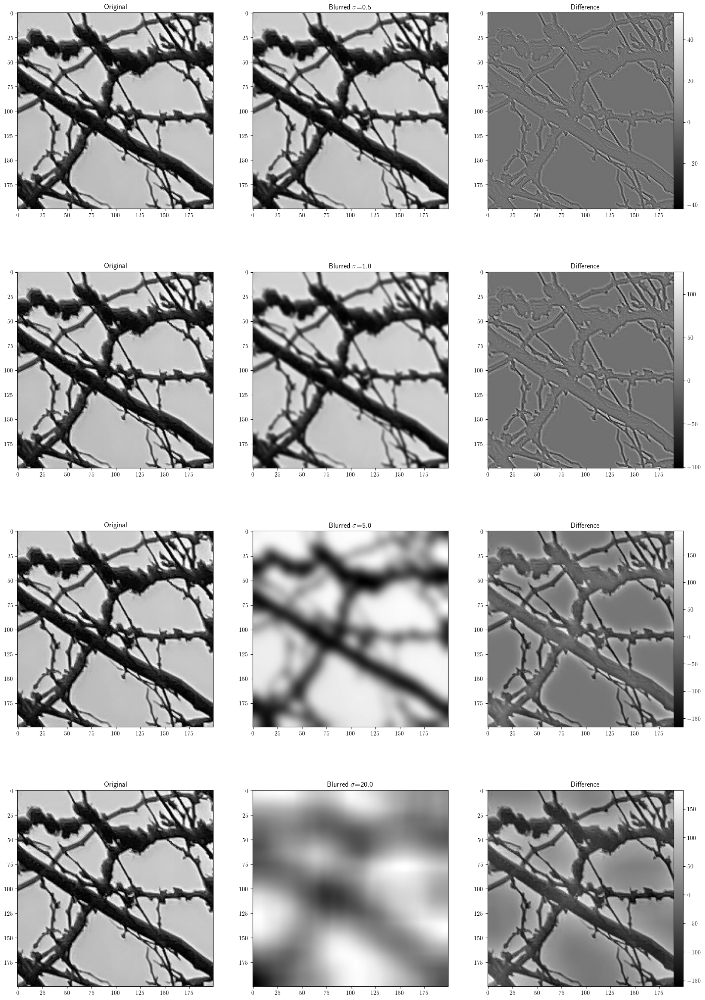

In [ ]:
figure = plt.figure()
figure.set_size_inches(20,30)
figure.clf()

#blurredMore = cv.GaussianBlur(image,(51,51),30)

sigmas = [0.5,1,5,20]
nRows = len(sigmas)
for cRow in range(nRows):
    blurred     = cv.GaussianBlur(image,(51,51),sigmas[cRow])
    axes = figure.add_subplot(nRows,3,cRow*3+1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')

    axes = figure.add_subplot(nRows,3,cRow*3+2)
    axes.imshow(blurred,cmap='gray')
    axes.set_title('Blurred $\sigma$=%3.1f' % sigmas[cRow])

    axes = figure.add_subplot(nRows,3,cRow*3+3)
    diff = image.astype(float) - blurred.astype(float) # cv.subtract(image,blurred)
    axes.imshow(diff,cmap='gray')
    axes.set_title('Difference')
    AddColorbar(axes)

plt.show()

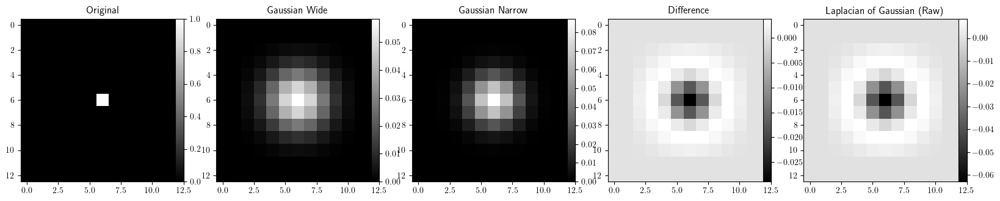

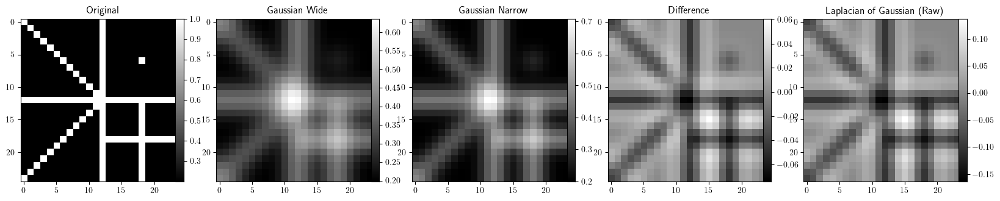

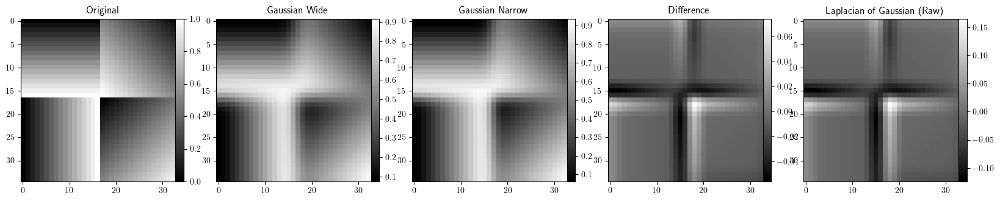

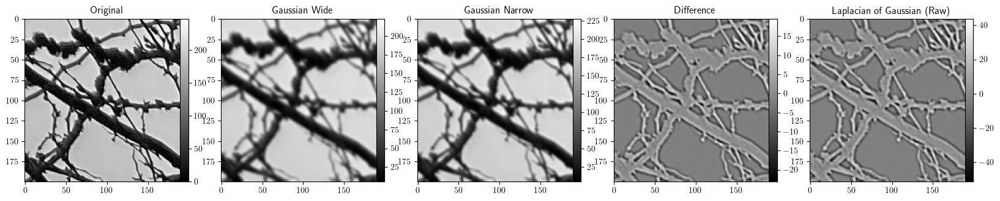

In [ ]:
order = 9 # Try different kernel orders
sigma = order/6 # Standard deviation in units of pixels 

kernel = LaplacianOfGaussianKernel(order,sigma)

gk1 = GaussianKernel(order,sigma*1.10)
gk2 = GaussianKernel(order,sigma*0.90)

# Note that the Laplacian has a negative value at the center of the kernel
# so features with a lot of curature will appear as black, rather than white

for cImage in range(4):
    if cImage==0:
        image = GetImpulseImage(nPixelsPerSide=order+4)
    elif cImage==1:
        image = GetTestImage()
    elif cImage==2:
        image = GetRampsImage(nPixelsPerSide=35)        
    else:
        image = cv.imread('DarkTree.jpeg',cv.IMREAD_GRAYSCALE)
        image = image[:200,:200]

    figure = plt.figure(1)
    figure.set_size_inches(20,10)

    axes = figure.add_subplot(1,5,1)
    axes.imshow(image,cmap='gray')
    axes.set_title('Original')
    AddColorbar(axes)

    fg1 = cv.filter2D(image,cv.CV_32F,gk1) 
    fg2 = cv.filter2D(image,cv.CV_32F,gk2) 
    fgd = fg1-fg2
    
    axes = figure.add_subplot(1,5,2)
    axes.imshow(fg1,cmap='gray')
    axes.set_title('Gaussian Wide'),
    AddColorbar(axes)
    
    axes = figure.add_subplot(1,5,3)
    axes.imshow(fg2,cmap='gray')
    axes.set_title('Gaussian Narrow'),
    AddColorbar(axes)
    
    axes = figure.add_subplot(1,5,4)
    axes.imshow(fgd,cmap='gray')
    axes.set_title('Difference'),
    AddColorbar(axes)
    
    filtered = cv.filter2D(image,cv.CV_32F,kernel) # 2D "Convolution" With the Kernel
    axes = figure.add_subplot(1,5,5)
    axes.imshow(filtered,cmap='gray')
    axes.set_title('Laplacian of Gaussian (Raw)'),
    AddColorbar(axes)
    
    plt.show()

## Laplacians vs Derivatives
* Both are useful for finding edges
* Gradients are directional, but the gradient magnitude is not
* Gradient magnitude is sensitive to linear regions
* Laplacian is based on second derivatives, so is insensitive to linear regions
* Both are sensitive to steps and edges
* The gradient magnitude typically has a hole at the center of the impulse response
* Generally, Laplacians and difference of Gaussians are preferred by practicioners for finding features

## Smoothing as Scale
* We normally think of images as two-dimensional representing the spatial coordinates
* There is also a dimension to color (typically represented by three numbers)
* If we have a sequence of images, we have a fourth dimension representing time
* We can also think about the scale of an image
    * Roughly analogous to zoom
    * Is an object far away in an image or close
    * How to we represent the object similarly regardless of scale
* In this sense, videos can be thought of as a 5D object
    * 2D spatial coordinates
    * 3 color channels
    * 1 time
    * 1 scale
* One way is to smooth the signal 
    * We can regard the smoothing parameter (typically sigma) as enabling us to move between scales
* Once an image is smoothed, we can decimate it if we like
    * But be careful: there is much to be said about downsampling
    * Keep the sampling theorem in mind